# PROJET CREDIT RISK 2025

### KELIAN, ZEKI, ARTHUR, ALEXANDRE

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Définir le chemin du fichier
file_path = r"C:\Users\kelia\Desktop\credit_risk\mortgage.csv"
# Charger le fichier CSV
df = pd.read_csv(file_path)
# Afficher les premières lignes
print(df.head())

   id  time  orig_time  first_time  mat_time  balance_time   LTV_time  \
0   1    25         -7          25       113      41303.42  24.498336   
1   1    26         -7          25       113      41061.95  24.483867   
2   1    27         -7          25       113      40804.42  24.626795   
3   1    28         -7          25       113      40483.89  24.735883   
4   1    29         -7          25       113      40367.06  24.925476   

   interest_rate_time  hpi_time  gdp_time  ...  REtype_SF_orig_time  \
0                 9.2    226.29  2.899137  ...                    1   
1                 9.2    225.10  2.151365  ...                    1   
2                 9.2    222.39  2.361722  ...                    1   
3                 9.2    219.67  1.229172  ...                    1   
4                 9.2    217.37  1.692969  ...                    1   

   investor_orig_time  balance_orig_time  FICO_orig_time  LTV_orig_time  \
0                   0            45000.0             715   

In [2]:
print(df.columns)

Index(['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time',
       'LTV_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time',
       'REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time',
       'investor_orig_time', 'balance_orig_time', 'FICO_orig_time',
       'LTV_orig_time', 'Interest_Rate_orig_time', 'hpi_orig_time',
       'default_time', 'payoff_time', 'status_time'],
      dtype='object')


In [3]:
# Vérifier les valeurs manquantes
missing_values = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100

# Affichage des variables ayant des valeurs manquantes
missing_data = pd.DataFrame({'Valeurs Manquantes': missing_values, 'Pourcentage': missing_percent})
print(missing_data[missing_data['Valeurs Manquantes'] > 0].sort_values(by='Pourcentage', ascending=False))


          Valeurs Manquantes  Pourcentage
LTV_time                 270     0.043374


In [4]:
from scipy import stats
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report

## Statistiques descriptives et nettoyage de la base de données

In [5]:
# Trier par 'id' et 'time'
df = df.sort_values(by=['id', 'time'], ascending=[True, False])

# Supprimer les doublons sur 'id'
df = df.drop_duplicates(subset=['id'])

# Vérifier la taille de la base après suppression des doublons
print("Taille après suppression des doublons :", df.shape)

Taille après suppression des doublons : (50000, 23)


In [6]:
# Vérifier si les colonnes existent avant d'appliquer les filtres
if "Interest_Rate_orig_time" in df.columns:
    df = df[df["Interest_Rate_orig_time"] <= 11.7]

if "mat_time" in df.columns:
    df = df[df["mat_time"] <= 186]

if "balance_time" in df.columns:
    df = df[df["balance_time"] <= 950000]

if "LTV_time" in df.columns:
    df = df[df["LTV_time"] <= 135]

if "interest_rate_time" in df.columns:
    df = df[df["interest_rate_time"] <= 12.25]

if "balance_orig_time" in df.columns:
    df = df[df["balance_orig_time"] <= 995000]

if "status_time" in df.columns:
    df = df[df["status_time"] != 0]

print("Filtrage terminé, nouvelle taille du DataFrame :", df.shape)


Filtrage terminé, nouvelle taille du DataFrame : (39881, 23)


In [ ]:
# Création de classes pour les variables continues
df["LTV_time_class"] = pd.cut(df["LTV_time"], bins=[0, 74, 85, 102, np.inf], labels=["0-74", "74-85", "85-102", "102+"])
df["mat_time_class"] = pd.cut(df["mat_time"], bins=[23, 137, 143, 186], labels=["23-137", "138-143", "144-186"])
df["hpi_time_class"] = pd.cut(df["hpi_time"], bins=[107, 159, 180, 209, 220, np.inf], labels=["107-159", "159-180", "180-209", "209-220", "220+"])
df["gdp_time_class"] = pd.cut(df["gdp_time"], bins=[-5, 1.5, 2.4, 5.1, np.inf], labels=["-5-1.5", "1.5-2.4", "2.4-5.1", "5.1+"])
df["uer_time_class"] = pd.cut(df["uer_time"], bins=[3.8, 4.7, 5.8, 10, np.inf], labels=["3.8-4.7", "4.7-5.8", "5.8-10", "10+"])
df["FICO_orig_time_class"] = pd.cut(df["FICO_orig_time"], bins=[400, 629, 693, 840], labels=["400-629", "630-693", "694-840"])
df["interest_rate_time_class"] = pd.cut(df["interest_rate_time"], bins=[1, 6.5, 7.985, 12.25], labels=["1-6.5", "6.5-7.99", "7.99-12.25"])
df["balance_time_class"] = pd.cut(df["balance_time"], bins=[0, 136185, 266287, 949366], labels=["0-136K", "136K-266K", "266K-949K"])
df["balance_orig_time_class"] = pd.cut(df["balance_orig_time"], bins=[0, 140700, 272500, 995000], labels=["0-140K", "140K-272K", "272K-995K"])
df["LTV_orig_time_class"] = pd.cut(df["LTV_orig_time"], bins=[50, 79.9, 100], labels=["50-79.9", "80-100"])

In [8]:
# Définir la variable cible "DEFAUT" 
df["DEFAUT"] = np.where(df["status_time"] == 1, 1, 0)

In [9]:
# Sauvegarder la base nettoyée en CSV
output_path = r"C:\Users\kelia\Desktop\credit_risk\base_projet_final.csv"
df.to_csv(output_path, index=False)

print("Base finale enregistrée avec succès :", output_path)

Base finale enregistrée avec succès : C:\Users\kelia\Desktop\credit_risk\base_projet_final.csv


# 1) Statistiques descriptives et nettoyage de la base de données

In [10]:
# Sélection des variables explicatives 
variables_exp = ["investor_orig_time", "mat_time_class", "balance_time_class",
                 "LTV_time_class", "interest_rate_time_class", "hpi_time_class",
                 "gdp_time_class", "uer_time_class", "balance_orig_time_class",
                 "FICO_orig_time_class", "LTV_orig_time_class"]

# Transformer les variables catégorielles en indicatrices (one-hot encoding)
df_encoded = pd.get_dummies(df[variables_exp], drop_first=True)

# Ajouter la variable cible
df_encoded["DEFAUT"] = df["DEFAUT"].astype(int)

In [11]:
# Aperçu des premières lignes
print(df.head())

    id  time  orig_time  first_time  mat_time  balance_time   LTV_time  \
23   1    48         -7          25       113      29087.21  26.658065   
25   2    26         18          25       138     105654.77  65.469851   
30   3    29         -6          25       114      44378.60  31.459735   
68   5    27         18          25       138      52100.71  66.346343   
99   6    56         19          25       139     190474.11  75.834755   

    interest_rate_time  hpi_time  gdp_time  ...  mat_time_class  \
23               9.200    146.45  2.715903  ...          23-137   
25               7.680    225.10  2.151365  ...         138-143   
30              11.375    217.37  1.692969  ...          23-137   
68               9.155    222.39  2.361722  ...         138-143   
99               6.580    181.43  1.717053  ...         138-143   

    hpi_time_class  gdp_time_class  uer_time_class  FICO_orig_time_class  \
23         107-159         2.4-5.1          5.8-10               694-840   


In [12]:
# Informations générales sur les colonnes
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 39881 entries, 23 to 622349
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   id                        39881 non-null  int64   
 1   time                      39881 non-null  int64   
 2   orig_time                 39881 non-null  int64   
 3   first_time                39881 non-null  int64   
 4   mat_time                  39881 non-null  int64   
 5   balance_time              39881 non-null  float64 
 6   LTV_time                  39881 non-null  float64 
 7   interest_rate_time        39881 non-null  float64 
 8   hpi_time                  39881 non-null  float64 
 9   gdp_time                  39881 non-null  float64 
 10  uer_time                  39881 non-null  float64 
 11  REtype_CO_orig_time       39881 non-null  int64   
 12  REtype_PU_orig_time       39881 non-null  int64   
 13  REtype_SF_orig_time       39881 non-null  int64  

In [13]:
# Vérifier les valeurs manquantes
missing_values = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100

# Affichage des variables ayant des valeurs manquantes
missing_data = pd.DataFrame({'Valeurs Manquantes': missing_values, 'Pourcentage': missing_percent})
print(missing_data[missing_data['Valeurs Manquantes'] > 0].sort_values(by='Pourcentage', ascending=False))


                          Valeurs Manquantes  Pourcentage
balance_time_class                       274     0.687044
LTV_time_class                           273     0.684536
LTV_orig_time_class                       71     0.178030
uer_time_class                            20     0.050149
interest_rate_time_class                   2     0.005015
FICO_orig_time_class                       2     0.005015
mat_time_class                             1     0.002507


In [14]:
# Suppression des lignes contenant des valeurs manquantes
df_clean = df.dropna()
print(f"Nouvelle taille du dataset : {df_clean.shape}")

Nouvelle taille du dataset : (39512, 34)


In [15]:
# Séparer les variables numériques et catégorielles
num_vars = df_clean.select_dtypes(include=['int64', 'float64']).columns
cat_vars = df_clean.select_dtypes(include=['object']).columns

print("Variables numériques :", list(num_vars))
print("Variables catégorielles :", list(cat_vars))


Variables numériques : ['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time', 'LTV_time', 'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time', 'REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time', 'investor_orig_time', 'balance_orig_time', 'FICO_orig_time', 'LTV_orig_time', 'Interest_Rate_orig_time', 'hpi_orig_time', 'default_time', 'payoff_time', 'status_time', 'DEFAUT']
Variables catégorielles : []


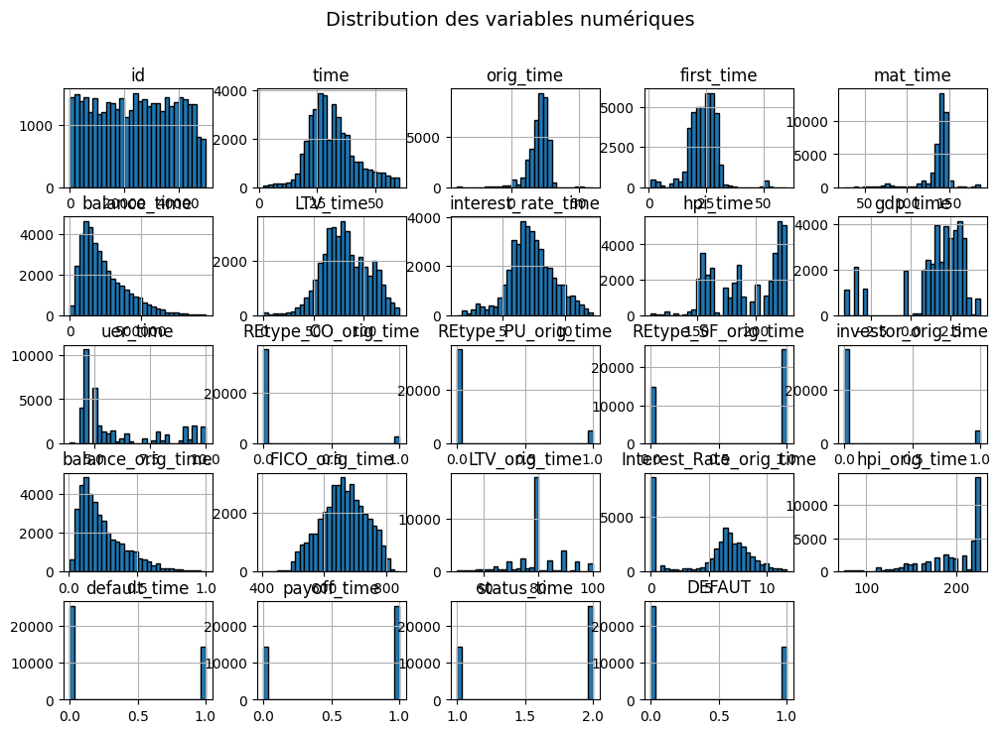

In [16]:
# Histogrammes des variables numériques
df_clean[num_vars].hist(figsize=(12, 8), bins=30, edgecolor='black')
plt.suptitle("Distribution des variables numériques", fontsize=14)
plt.show()


In [17]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [18]:
# Créer des subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=[
    'Balance Time', 'LTV Time', 'Interest Rate Time', 'HPI Time'
])

# Boxplot pour Balance Time
fig.add_trace(go.Box(y=df_clean['balance_time'], name='Balance Time'), row=1, col=1)

# Boxplot pour LTV Time
fig.add_trace(go.Box(y=df_clean['LTV_time'], name='LTV Time'), row=1, col=2)

# Boxplot pour Interest Rate Time
fig.add_trace(go.Box(y=df_clean['interest_rate_time'], name='Interest Rate Time'), row=2, col=1)

# Boxplot pour HPI Time
fig.add_trace(go.Box(y=df_clean['hpi_time'], name='HPI Time'), row=2, col=2)

# Mise en page
fig.update_layout(
    title_text='Boxplots des variables financières',
    title_x=0.5,
    plot_bgcolor='#F5F5F5',
    paper_bgcolor='#F5F5F5',
    showlegend=False
)

# Ajustement des axes
fig.update_yaxes(showgrid=True, gridwidth=.5, gridcolor='#C7C8CC')

# Afficher le graphique
fig.show()

### Détection valeurs aberrantes et nettoyage de la table

In [19]:

# Afficher les statistiques descriptives
print(df_clean.describe())


                 id          time     orig_time    first_time      mat_time  \
count  39512.000000  39512.000000  39512.000000  39512.000000  39512.000000   
mean   24330.008403     31.469047     20.045682     23.497368    137.570536   
std    14183.712238     10.108891      7.101520      6.293730     15.560762   
min        1.000000      2.000000    -40.000000      1.000000     26.000000   
25%    12027.500000     25.000000     17.000000     20.000000    136.000000   
50%    24509.500000     30.000000     21.000000     24.000000    141.000000   
75%    36612.250000     37.000000     25.000000     27.000000    145.000000   
max    49984.000000     60.000000     60.000000     60.000000    186.000000   

        balance_time      LTV_time  interest_rate_time      hpi_time  \
count   39512.000000  39512.000000        39512.000000  39512.000000   
mean   237164.762206     81.008973            7.300854    191.335171   
std    163037.710731     23.054357            1.823350     28.342899   


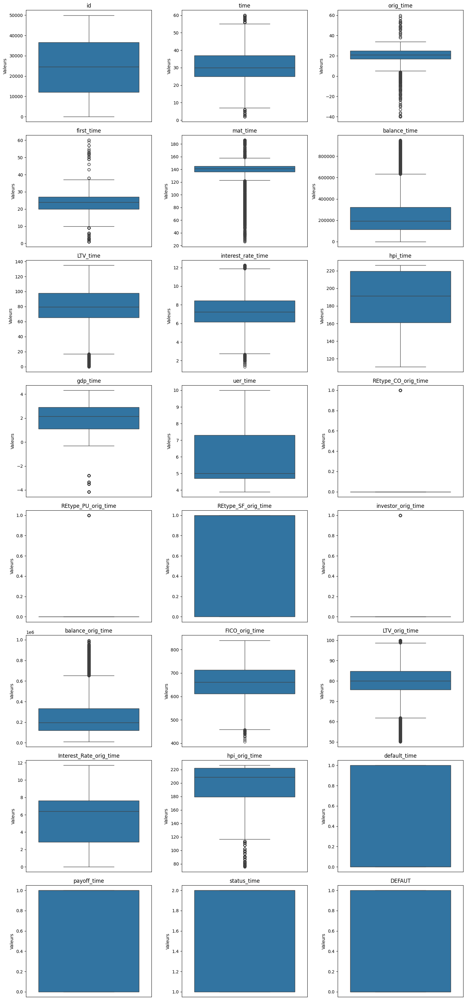

In [20]:

# Sélection des variables numériques à analyser
numerical_cols = df_clean.select_dtypes(include=['int64', 'float64']).columns

# Définir le nombre de lignes et colonnes pour les subplots
n_cols = 3  
n_rows = -(-len(numerical_cols) // n_cols)  

# Créer les subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()  

# Générer les boxplots
for i, col in enumerate(numerical_cols):
    sns.boxplot(y=df_clean[col], ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_ylabel("Valeurs")
    axes[i].set_xticks([])  

# Supprimer les cases vides s'il y en a
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Améliorer l'affichage
plt.tight_layout()
plt.show()


In [21]:
import numpy as np

# Fonction pour remplacer les valeurs extrêmes par la médiane
def traiter_outliers(df_clean, colonnes):
    for col in colonnes:
        q1 = df_clean[col].quantile(0.25)
        q3 = df_clean[col].quantile(0.75)
        iqr = q3 - q1
        borne_inf = q1 - 1.5 * iqr
        borne_sup = q3 + 1.5 * iqr
        mediane = df_clean[col].median()
        
        # Remplacer les outliers par la médiane
        df_clean[col] = np.where((df_clean[col] < borne_inf) | (df_clean[col] > borne_sup), mediane, df_clean[col])

# Appliquer aux colonnes numériques
colonnes_numeriques = df_clean.select_dtypes(include=['int64', 'float64']).columns
traiter_outliers(df_clean, colonnes_numeriques)

# Vérification après correction
print(df_clean.describe())


                 id          time     orig_time    first_time      mat_time  \
count  39512.000000  39512.000000  39512.000000  39512.000000  39512.000000   
mean   24330.008403     30.936551     20.842124     23.734764    140.787837   
std    14183.712238      8.943233      5.187456      4.511775      5.058811   
min        1.000000      7.000000      5.000000     10.000000    123.000000   
25%    12027.500000     25.000000     18.000000     20.000000    138.000000   
50%    24509.500000     30.000000     21.000000     24.000000    141.000000   
75%    36612.250000     36.000000     25.000000     27.000000    145.000000   
max    49984.000000     55.000000     34.000000     37.000000    158.000000   

        balance_time      LTV_time  interest_rate_time      hpi_time  \
count   39512.000000  39512.000000        39512.000000  39512.000000   
mean   221814.911904     81.476741            7.334795    191.335171   
std    138350.119114     22.270178            1.733909     28.342899   


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\49220229.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\49220229.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\49220229.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

In [22]:
df_corr = df_clean.select_dtypes(include=['int64', 'float64'])  # Garder uniquement les nombres

c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.



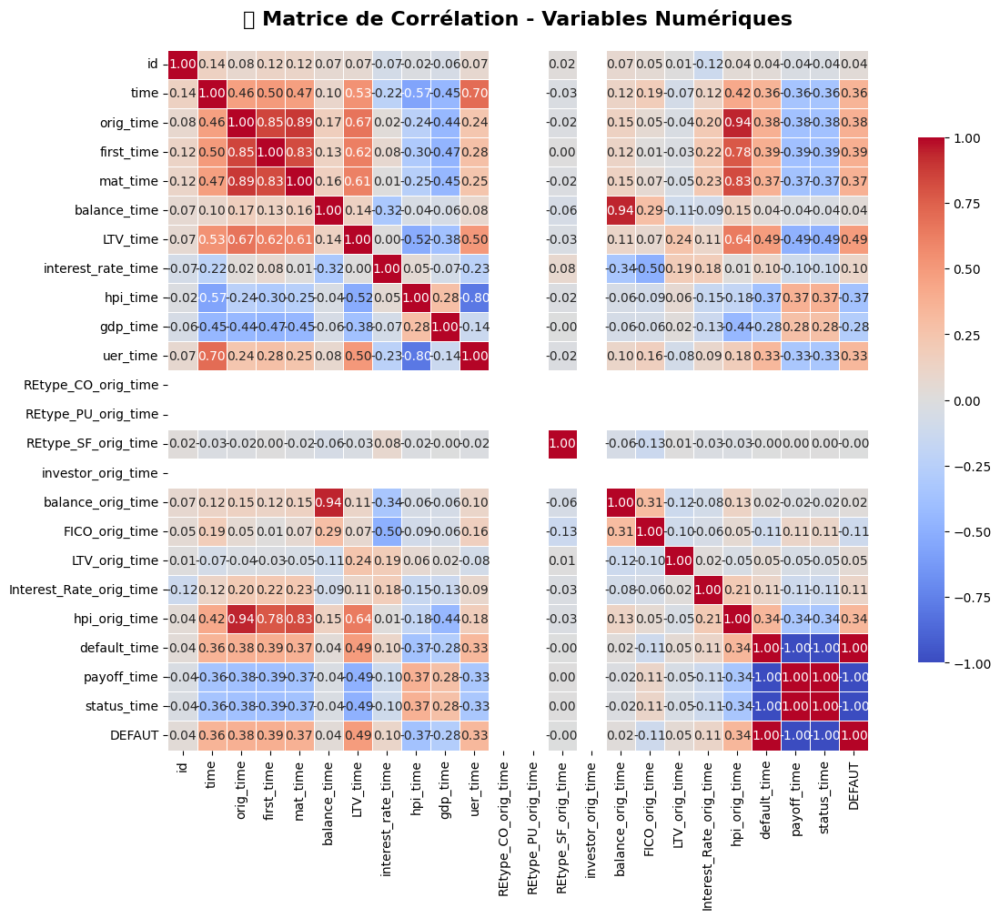

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Créer la figure avec une taille plus grande pour la lisibilité
plt.figure(figsize=(14, 10))

# Générer la heatmap avec les paramètres améliorés
sns.heatmap(df_corr.corr(), 
            annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, 
            vmin=-1, vmax=1, center=0, square=True, 
            cbar_kws={"shrink": 0.75})

# Ajouter un titre clair et centré
plt.title("🔍 Matrice de Corrélation - Variables Numériques", fontsize=16, fontweight="bold", pad=20)

# Afficher le graphique
plt.show()

# 2) Analyse bivariée selon le risque de défaut 

In [24]:
# Vérifier les valeurs uniques de la variable cible
print(df["DEFAUT"].value_counts())

DEFAUT
0    25662
1    14219
Name: count, dtype: int64


In [25]:
import plotly.graph_objects as go
import plotly.io as pio

# Remplacer 0/1 par "yes"/"no" pour plus de clarté
df["DEFAUT_LABEL"] = df["DEFAUT"].apply(lambda x: 'yes' if x == 1 else 'no')

# Compter les occurrences
count_defaults = df["DEFAUT_LABEL"].value_counts()

# Création des barres
trace0 = go.Bar(
    x=["Yes"], y=[count_defaults["yes"]],
    name="Défauts", marker=dict(color='#FF6868', line=dict(color="#EF4040", width=2))
)

trace1 = go.Bar(
    x=["No"], y=[count_defaults["no"]],
    name="Non Défauts", marker=dict(color='#9ADE7B', line=dict(color="#65B741", width=2))
)

# Définition du layout
layout = go.Layout(
    title="Répartition des défauts sur crédits",
    title_x=0.5,
    yaxis=dict(title="Total"),
    xaxis=dict(title="Variable cible"),
    plot_bgcolor='#F5F5F5',
    paper_bgcolor='#F5F5F5'
)

# Création de la figure
fig = go.Figure(data=[trace0, trace1], layout=layout)
fig.update_yaxes(showgrid=True, gridwidth=.5, gridcolor='#C7C8CC')

# Afficher la figure
pio.show(fig)


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1632090563.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1632090563.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1632090563.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1632090563.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect

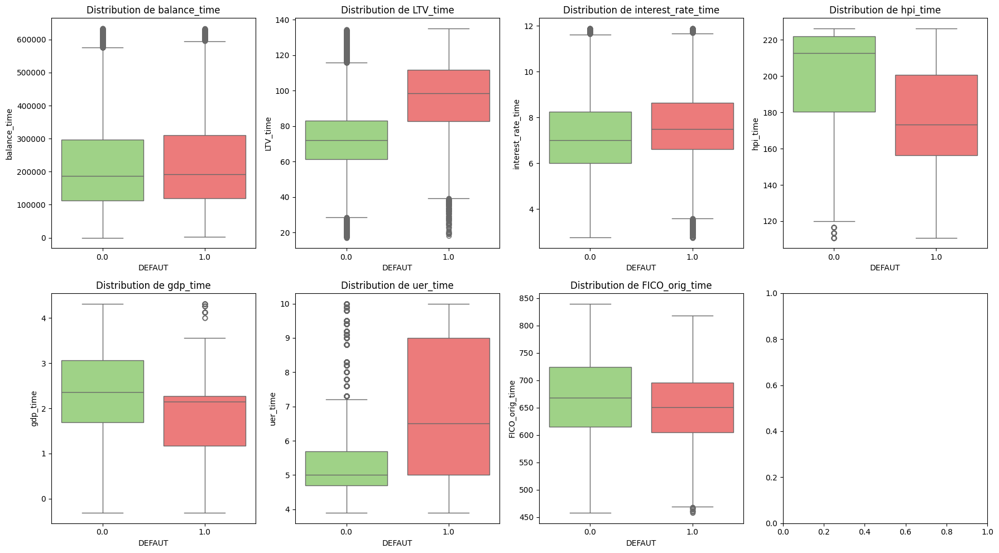

In [26]:

num_vars = ["balance_time", "LTV_time", "interest_rate_time", "hpi_time", "gdp_time", "uer_time", "FICO_orig_time"]
fig, axes = plt.subplots(2, 4, figsize=(18, 10))

for i, col in enumerate(num_vars):
    row, col_index = divmod(i, 4)
    sns.boxplot(data=df_clean, x="DEFAUT", y=col, ax=axes[row, col_index], palette=["#9ADE7B", "#FF6868"])
    axes[row, col_index].set_title(f"Distribution de {col}")

plt.tight_layout()
plt.show()

In [27]:

import seaborn as sns

# Définir les tranches de montants (bins) et leurs labels
bins = [0, 50000, 100000, 200000, 300000, 1000000]
labels = ['0-50K', '50K-100K', '100K-200K', '200K-300K', '+300K']

# Appliquer les tranches à la colonne 'balance_time'
df_clean['balance_time_class'] = pd.cut(df_clean['balance_time'], bins=bins, labels=labels, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
balance_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['balance_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)

# Appliquer une mise en forme avec des couleurs
balance_crosstab = balance_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

balance_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3633907856.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



balance_time_class,0-50K,50K-100K,100K-200K,200K-300K,+300K
DEFAUT,,,,,
0.000000,74.94%,64.52%,65.33%,61.77%,62.25%
1.000000,25.06%,35.48%,34.67%,38.23%,37.75%


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1373766878.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1373766878.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




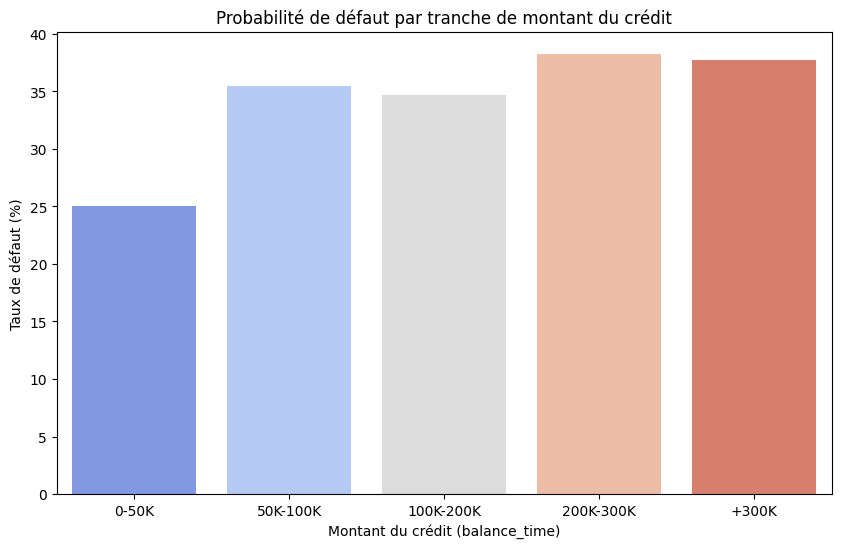

In [28]:
import matplotlib.pyplot as plt

# Calculer les taux de défaut par tranche de balance_time
balance_default_rates = df_clean.groupby('balance_time_class')['DEFAUT'].mean() * 100

# Afficher le barplot
plt.figure(figsize=(10,6))
sns.barplot(x=balance_default_rates.index, y=balance_default_rates.values, palette="coolwarm")

plt.title("Probabilité de défaut par tranche de montant du crédit")
plt.ylabel("Taux de défaut (%)")
plt.xlabel("Montant du crédit (balance_time)")
plt.show()


In [29]:
# Définir les tranches LTV
bins_LTV = [0, 50, 70, 85, 100, 150]  
labels_LTV = ['0-50%', '50-70%', '70-85%', '85-100%', '+100%']  

# Appliquer les tranches
df_clean['LTV_time_class'] = pd.cut(df_clean['LTV_time'], bins=bins_LTV, labels=labels_LTV, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
LTV_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['LTV_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)
LTV_crosstab = LTV_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

LTV_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1606851515.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



LTV_time_class,0-50%,50-70%,70-85%,85-100%,+100%
DEFAUT,,,,,
0.000000,87.13%,88.48%,76.15%,49.24%,25.66%
1.000000,12.87%,11.52%,23.85%,50.76%,74.34%


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2174996633.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2174996633.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




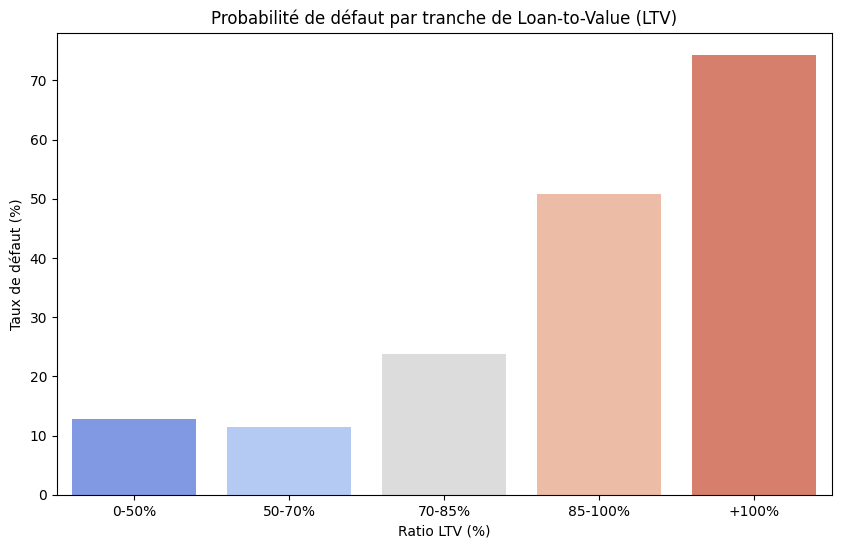

In [30]:
# Calculer les taux de défaut par tranche de LTV_time
LTV_default_rates = df_clean.groupby('LTV_time_class')['DEFAUT'].mean() * 100

# Afficher le barplot
plt.figure(figsize=(10,6))
sns.barplot(x=LTV_default_rates.index, y=LTV_default_rates.values, palette="coolwarm")

plt.title("Probabilité de défaut par tranche de Loan-to-Value (LTV)")
plt.ylabel("Taux de défaut (%)")
plt.xlabel("Ratio LTV (%)")
plt.show()


In [31]:
# Définir les tranches de taux d'intérêt
bins_IR = [0, 2, 4, 6, 8, 10, 15]  
labels_IR = ['0-2%', '2-4%', '4-6%', '6-8%', '8-10%', '+10%']

# Appliquer les tranches
df_clean['interest_rate_time_class'] = pd.cut(df_clean['interest_rate_time'], bins=bins_IR, labels=labels_IR, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
IR_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['interest_rate_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)
IR_crosstab = IR_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

IR_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\678401036.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



interest_rate_time_class,2-4%,4-6%,6-8%,8-10%,+10%
DEFAUT,,,,,
0.000000,52.07%,79.39%,63.97%,56.60%,59.70%
1.000000,47.93%,20.61%,36.03%,43.40%,40.30%


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2943703301.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2943703301.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




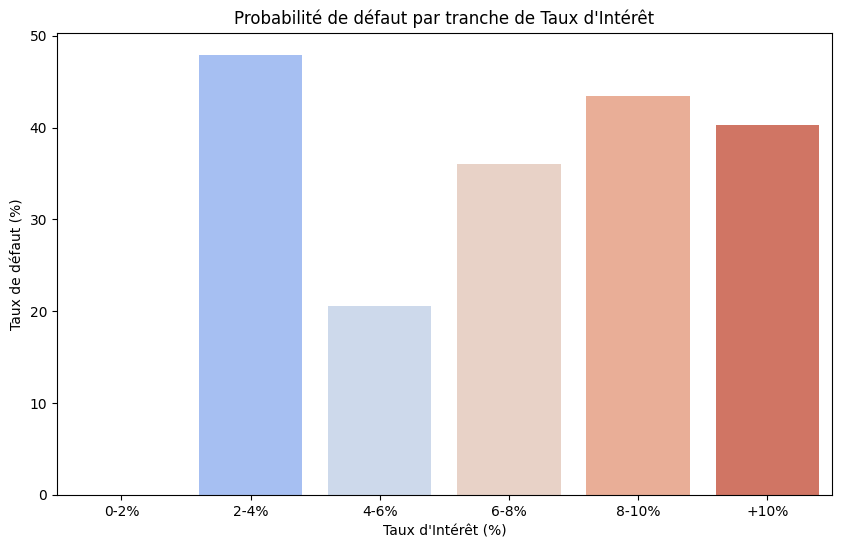

In [32]:
# Calculer les taux de défaut par tranche de interest_rate_time
IR_default_rates = df_clean.groupby('interest_rate_time_class')['DEFAUT'].mean() * 100

# Afficher le barplot
plt.figure(figsize=(10,6))
sns.barplot(x=IR_default_rates.index, y=IR_default_rates.values, palette="coolwarm")

plt.title("Probabilité de défaut par tranche de Taux d'Intérêt")
plt.ylabel("Taux de défaut (%)")
plt.xlabel("Taux d'Intérêt (%)")
plt.show()


In [ ]:
import plotly.graph_objects as go

# Séparer les clients en défaut et non défaut
df_good = df_clean[df_clean["DEFAUT"] == 0]
df_bad = df_clean[df_clean["DEFAUT"] == 1]

# Définir les variables à analyser
variables = ["balance_time", "LTV_time", "interest_rate_time"]

# Créer les histogrammes pour chaque variable
for var in variables:
    x1 = df_good[var]
    x2 = df_bad[var]

    fig = go.Figure()
    
    fig.add_trace(go.Histogram(
        x=x1,
        name='Non Défauts',
        marker_color='#9ADE7B',
        opacity=0.7
    ))
    
    fig.add_trace(go.Histogram(
        x=x2,
        name='Défauts',
        marker_color='#FF6868',
        opacity=0.7
    ))

    fig.update_layout(
        title_text=f"Distribution de {var} selon la variable cible",
        title_x=0.5,
        xaxis_title_text=var,
        yaxis_title_text='Nombre de clients',
        bargap=0.2,
        bargroupgap=0.1,
        barmode='overlay',
        plot_bgcolor='#F5F5F5',
        paper_bgcolor='#F5F5F5'
    )

    fig.update_yaxes(showgrid=True, gridwidth=.5, gridcolor='#C7C8CC')

    # Afficher l'histogramme
    fig.show()


In [34]:
import plotly.graph_objects as go
import plotly.subplots as sp



# Séparer les clients en défaut et non défaut
df_good = df_clean[df_clean["DEFAUT"] == 0]
df_bad = df_clean[df_clean["DEFAUT"] == 1]

# Définir les variables à analyser
variables = ["balance_time", "LTV_time", "interest_rate_time"]

# Générer les subplots pour chaque variable
for var in variables:
    x1 = df_bad[var]
    x2 = df_good[var]
    x3 = df_clean[var]

    # Création de la figure avec subplots
    fig = sp.make_subplots(
        rows=2, cols=2, 
        specs=[[{}, {}], [{'colspan': 2}, None]],
        subplot_titles=('Défauts', 'Non Défauts', 'Distribution Globale')
    )

    # Distribution des Défauts
    fig.add_trace(go.Histogram(
        x=x1, name="Défauts", marker=dict(color='#FF6868')
    ), row=1, col=1)

    # Distribution des Non Défauts
    fig.add_trace(go.Histogram(
        x=x2, name="Non Défauts", marker=dict(color='#9ADE7B')
    ), row=1, col=2)

    # Distribution Globale (en %)
    fig.add_trace(go.Histogram(
        x=x3, histnorm='percent', name="Distribution Globale", marker=dict(color='#86A7FC')
    ), row=2, col=1)

    # Personnalisation des couleurs et du fond
    fig.update_layout(
        title=f"Distribution de {var} selon la variable cible",
        title_x=0.5, bargap=0.05,
        plot_bgcolor='#F5F5F5', paper_bgcolor='#F5F5F5'
    )

    # Affichage du graphique
    fig.show()


In [35]:

import seaborn as sns

# Définir les tranches de score FICO
bins_FICO = [300, 500, 600, 660, 720, 850]  
labels_FICO = ['300-500', '500-600', '600-660', '660-720', '720-850']

# Appliquer les tranches
df_clean['FICO_orig_time_class'] = pd.cut(df_clean['FICO_orig_time'], bins=bins_FICO, labels=labels_FICO, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
FICO_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['FICO_orig_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)
FICO_crosstab = FICO_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

# Affichage du tableau croisé avec mise en forme
FICO_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2234304170.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



FICO_orig_time_class,300-500,500-600,600-660,660-720,720-850
DEFAUT,,,,,
0.000000,44.30%,61.25%,58.85%,62.38%,75.71%
1.000000,55.70%,38.75%,41.15%,37.62%,24.29%


In [36]:
import plotly.graph_objects as go

# Séparer les clients en défaut et non défaut
df_good = df_clean[df_clean["DEFAUT"] == 0]
df_bad = df_clean[df_clean["DEFAUT"] == 1]

x1 = df_good['FICO_orig_time']
x2 = df_bad['FICO_orig_time']

# Créer l'histogramme
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=x1,
    name='Non Défauts',  
    marker_color='#9ADE7B',
))
fig.add_trace(go.Histogram(
    x=x2,
    name='Défauts',
    marker_color='#FF6868',
))

# Personnalisation du graphique
fig.update_layout(
    title_text="Distribution du score FICO selon la variable cible",
    title_x=0.5,
    xaxis_title_text="Score FICO",
    yaxis_title_text="Nombre de clients",
    bargap=0.2,
    bargroupgap=0.1,
    barmode="stack",
    plot_bgcolor="#F5F5F5",
    paper_bgcolor="#F5F5F5"
)

fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor="#C7C8CC")

# Affichage du graphique
fig.show()


### uer

In [37]:


# Définir les tranches du taux de chômage
bins_uer = [0, 2, 4, 6, 8, 10, 15]
labels_uer = ['0-2%', '2-4%', '4-6%', '6-8%', '8-10%', '+10%']

# Appliquer les tranches
df_clean['uer_time_class'] = pd.cut(df_clean['uer_time'], bins=bins_uer, labels=labels_uer, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
uer_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['uer_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)
uer_crosstab = uer_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

# Affichage du tableau croisé avec mise en forme
uer_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2245866496.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



uer_time_class,2-4%,4-6%,6-8%,8-10%,+10%
DEFAUT,,,,,
0.000000,77.27%,74.52%,48.96%,37.28%,34.62%
1.000000,22.73%,25.48%,51.04%,62.72%,65.38%


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3409203285.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3409203285.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




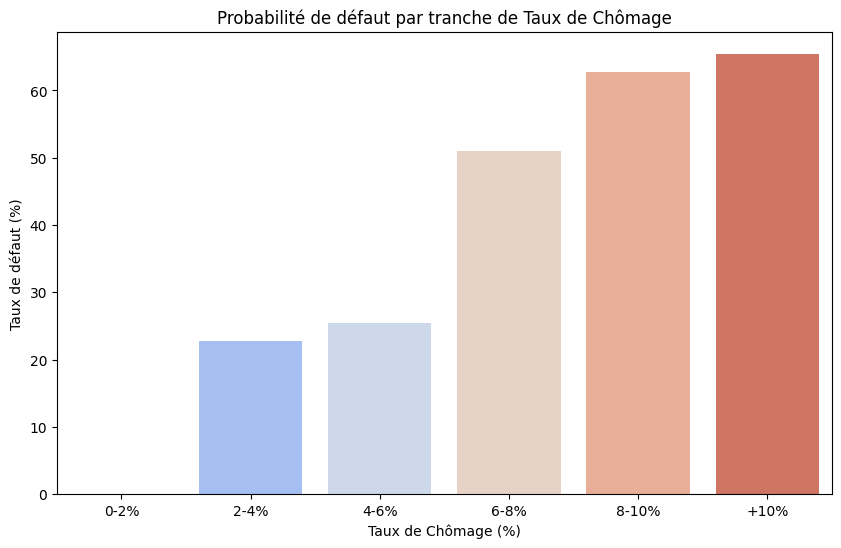

In [38]:
# Calculer les taux de défaut par tranche de uer_time
uer_default_rates = df_clean.groupby('uer_time_class')['DEFAUT'].mean() * 100

# Afficher le barplot
plt.figure(figsize=(10,6))
sns.barplot(x=uer_default_rates.index, y=uer_default_rates.values, palette="coolwarm")

plt.title("Probabilité de défaut par tranche de Taux de Chômage")
plt.ylabel("Taux de défaut (%)")
plt.xlabel("Taux de Chômage (%)")
plt.show()


### gdp_time

In [39]:


# Définir les tranches du PIB (gdp_time)
bins_gdp = [-10, -2, 0, 2, 4, 6, 10]  # Tranches adaptées aux variations économiques
labels_gdp = ['Récession Forte (<-2%)', 'Légère Récession (-2% à 0%)', 'Croissance Faible (0% à 2%)', 
              'Croissance Modérée (2% à 4%)', 'Croissance Forte (4% à 6%)', 'Boom Économique (>6%)']

# Appliquer les tranches
df_clean['gdp_time_class'] = pd.cut(df_clean['gdp_time'], bins=bins_gdp, labels=labels_gdp, right=False)

# Calculer la probabilité de défaut par tranche
cm = sns.light_palette("gold", as_cmap=True)
gdp_crosstab = pd.crosstab(df_clean['DEFAUT'], df_clean['gdp_time_class']).apply(lambda x: x / x.sum() * 100, axis=0)
gdp_crosstab = gdp_crosstab.style.background_gradient(cmap=cm, axis=1).format('{:.2f}%')

# Affichage du tableau croisé avec mise en forme
gdp_crosstab


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1001651139.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



gdp_time_class,Légère Récession (-2% à 0%),Croissance Faible (0% à 2%),Croissance Modérée (2% à 4%),Croissance Forte (4% à 6%)
DEFAUT,,,,
0.000000,35.26%,56.19%,69.98%,89.22%
1.000000,64.74%,43.81%,30.02%,10.78%


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1361203200.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\1361203200.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




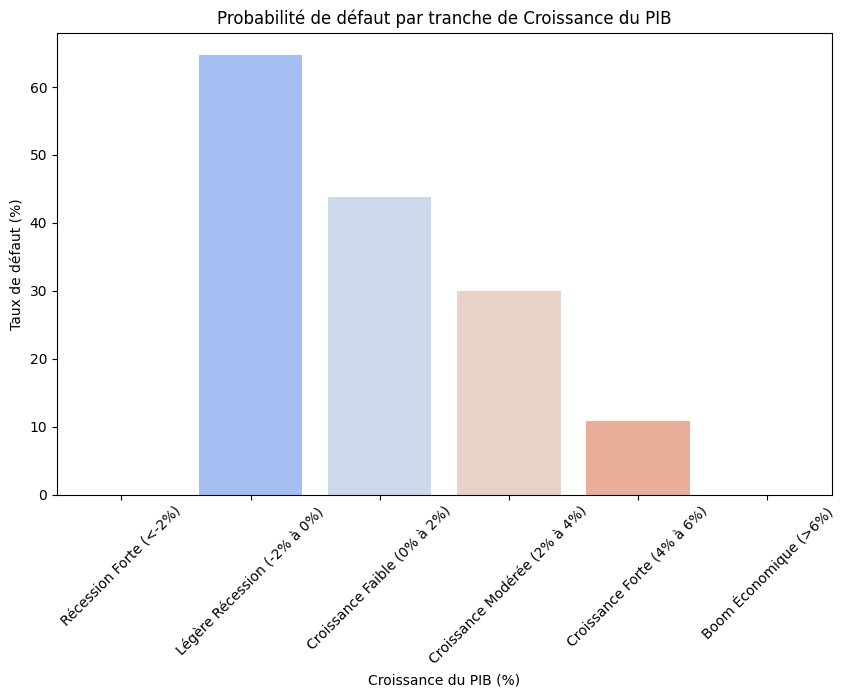

In [40]:
# Calculer les taux de défaut par tranche de gdp_time
gdp_default_rates = df_clean.groupby('gdp_time_class')['DEFAUT'].mean() * 100

# Afficher le barplot
plt.figure(figsize=(10,6))
sns.barplot(x=gdp_default_rates.index, y=gdp_default_rates.values, palette="coolwarm")

plt.title("Probabilité de défaut par tranche de Croissance du PIB")
plt.ylabel("Taux de défaut (%)")
plt.xlabel("Croissance du PIB (%)")
plt.xticks(rotation=45)  # Améliorer la lisibilité des catégories
plt.show()


In [41]:
import plotly.graph_objects as go
import plotly.subplots as sp


# Séparer les clients en défaut et non défaut
df_good = df_clean[df_clean["DEFAUT"] == 0]
df_bad = df_clean[df_clean["DEFAUT"] == 1]

# Définir les variables à analyser
variables = ["FICO_orig_time", "uer_time", "gdp_time"]

# Générer les subplots pour chaque variable
for var in variables:
    x1 = df_bad[var]  # Clients en défaut
    x2 = df_good[var]  # Clients non en défaut
    x3 = df_clean[var]  # Distribution globale

    # Création de la figure avec subplots
    fig = sp.make_subplots(
        rows=2, cols=2, 
        specs=[[{}, {}], [{'colspan': 2}, None]],
        subplot_titles=('Défauts', 'Non Défauts', 'Distribution Globale')
    )

    # Distribution des Défauts
    fig.add_trace(go.Histogram(
        x=x1, name="Défauts", marker=dict(color='#FF6868')
    ), row=1, col=1)

    # Distribution des Non Défauts
    fig.add_trace(go.Histogram(
        x=x2, name="Non Défauts", marker=dict(color='#9ADE7B')
    ), row=1, col=2)

    # Distribution Globale (en %)
    fig.add_trace(go.Histogram(
        x=x3, histnorm='percent', name="Distribution Globale", marker=dict(color='#86A7FC')
    ), row=2, col=1)

    # Personnalisation des couleurs et du fond
    fig.update_layout(
        title=f"Distribution de {var} selon la variable cible",
        title_x=0.5, bargap=0.05,
        plot_bgcolor='#F5F5F5', paper_bgcolor='#F5F5F5'
    )

    # Affichage du graphique
    fig.show()


# 3) Profil de défaut

In [42]:

# Sélectionner uniquement les variables numériques
df_num = df_clean.select_dtypes(include=['number'])

# Vérifier que "DEFAUT" est bien présent
if "DEFAUT" not in df_num.columns:
    print("Erreur : La colonne 'DEFAUT' n'est pas numérique ou absente du DataFrame.")
else:
    # Calculer la corrélation avec DEFAUT et trier les valeurs
    df_corr = df_num.corr()["DEFAUT"].drop("DEFAUT").sort_values(ascending=False)

    # Afficher les 10 variables les plus influentes
    print("\n🔹 Variables les plus corrélées positivement avec DEFAUT :")
    print(df_corr.head(10))  

    print("\n🔹 Variables les plus corrélées négativement avec DEFAUT :")
    print(df_corr.tail(10))




🔹 Variables les plus corrélées positivement avec DEFAUT :
default_time               1.000000
LTV_time                   0.491911
first_time                 0.389746
orig_time                  0.376058
mat_time                   0.369783
time                       0.357975
hpi_orig_time              0.336038
uer_time                   0.334438
Interest_Rate_orig_time    0.109832
interest_rate_time         0.104708
Name: DEFAUT, dtype: float64

🔹 Variables les plus corrélées négativement avec DEFAUT :
balance_orig_time      0.022151
REtype_SF_orig_time   -0.004968
FICO_orig_time        -0.113728
gdp_time              -0.276491
hpi_time              -0.367294
payoff_time           -1.000000
status_time           -1.000000
REtype_CO_orig_time         NaN
REtype_PU_orig_time         NaN
investor_orig_time          NaN
Name: DEFAUT, dtype: float64


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\634081861.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




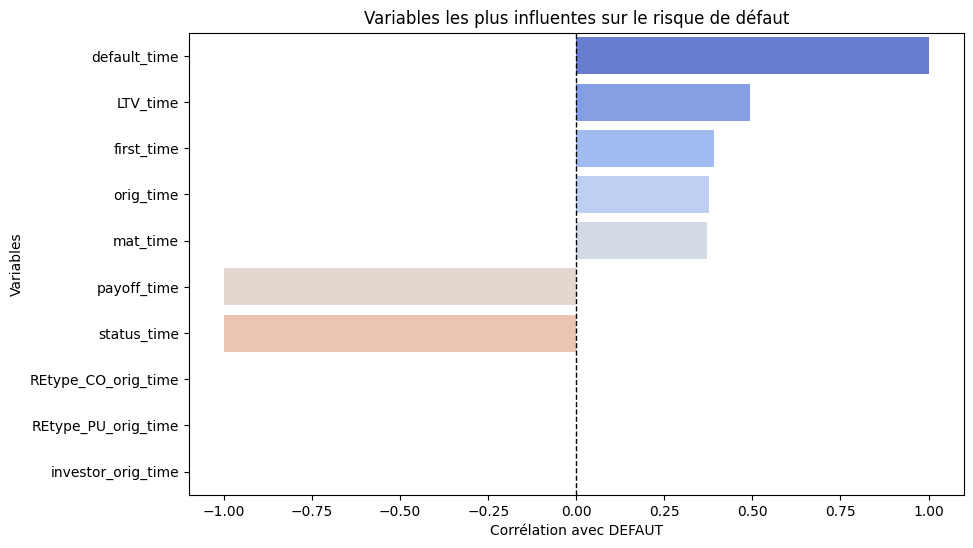

In [43]:

# Sélection des 10 variables les plus et moins corrélées
top_corr = df_corr.head(5)  # Top 5 positives
bottom_corr = df_corr.tail(5)  # Top 5 négatives
df_top_corr = pd.concat([top_corr, bottom_corr])

# Création du barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=df_top_corr.values, y=df_top_corr.index, palette="coolwarm")

# Personnalisation du graphique
plt.xlabel("Corrélation avec DEFAUT")
plt.ylabel("Variables")
plt.title("Variables les plus influentes sur le risque de défaut")
plt.axvline(x=0, color="black", linestyle="--", linewidth=1)  # Ligne verticale à 0
plt.show()


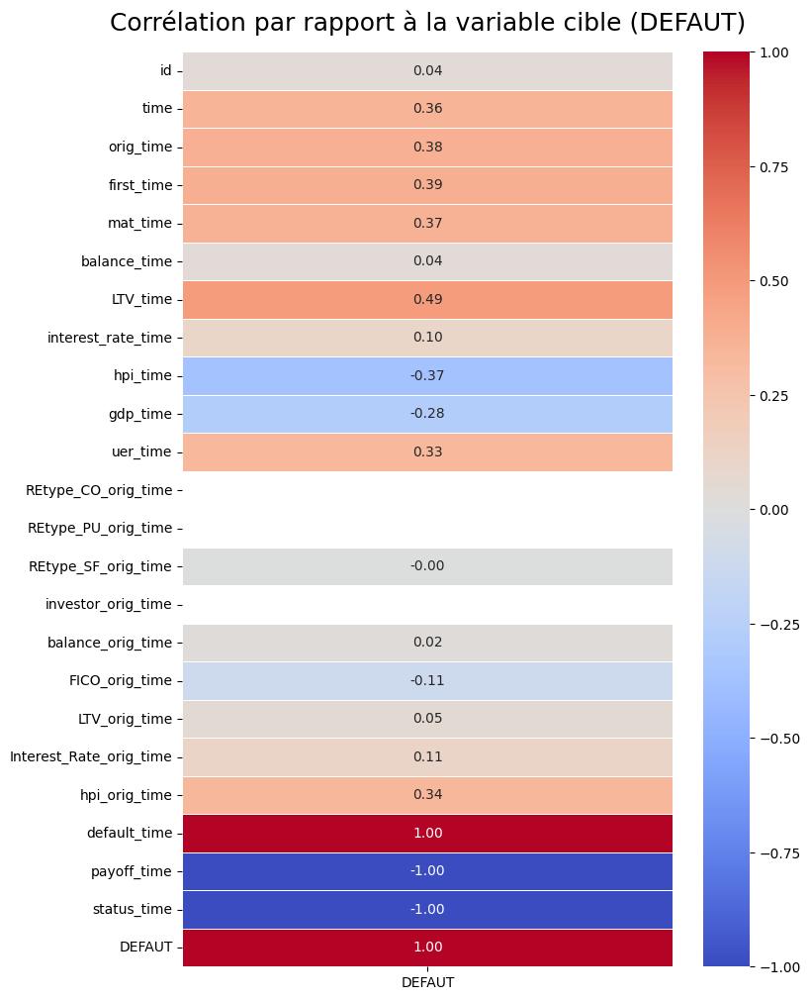

In [44]:
# Sélectionner uniquement les variables numériques
df_num = df_clean.select_dtypes(include=['number'])

# Créer une figure avec une taille adaptée
plt.figure(figsize=(8, 12))

# Affichage de la heatmap de corrélation uniquement avec `DEFAUT`
heatmap = sns.heatmap(df_num.corr()[['DEFAUT']], annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")

# Personnalisation du titre
heatmap.set_title('Corrélation par rapport à la variable cible (DEFAUT)', fontdict={'fontsize': 18}, pad=16)

# Affichage du graphique
plt.show()


In [45]:
import plotly.express as px
# Sélectionner uniquement les variables numériques
df_num = df_clean.select_dtypes(include=['number'])

# Création de la matrice de corrélation
fig = px.imshow(
    df_num.corr().round(2),  # Arrondi des valeurs pour plus de lisibilité
    text_auto=True,  # Affichage des valeurs directement
    aspect="auto",
    labels=dict(x="Matrice de corrélation", color="Corrélation"),
    color_continuous_scale="RdBu_r"  # Palette plus contrastée
)

# Personnalisation de l'affichage
fig.update_layout(
    title="Matrice de Corrélation des Variables Numériques",
    title_x=0.5,  # Centrage du titre
    width=1200, height=800,  # Augmenter la taille de l'affichage
    font=dict(size=12),  # Taille de police ajustée
)

# Ajustement des axes pour une meilleure lisibilité
fig.update_xaxes(side="top", tickangle=-45)  # Rotation des noms de colonnes
fig.update_yaxes(tickangle=0)  # Alignement vertical

# Affichage du graphique
fig.show()


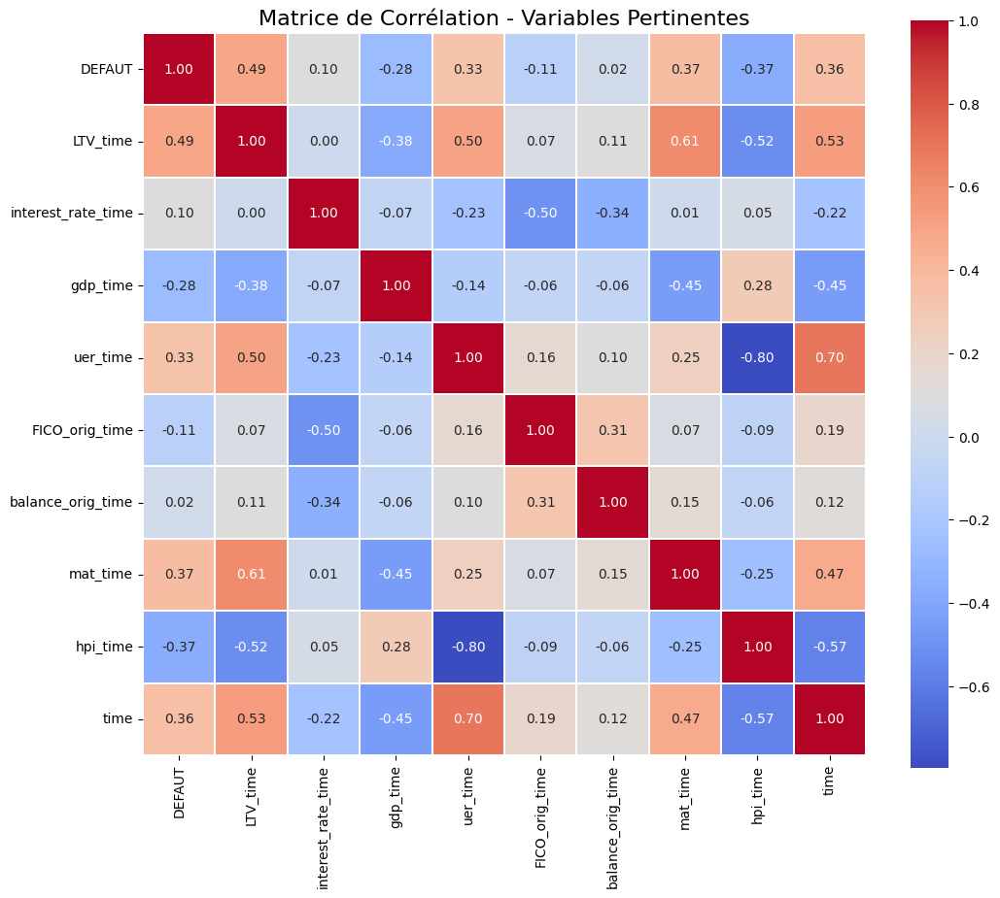

In [46]:
# Sélectionner uniquement les variables numériques
df_num = df_clean.select_dtypes(include=['number'])

# Suppression des variables inutiles si nécessaire
variables_pertinentes = [
    "DEFAUT", "LTV_time", "interest_rate_time", "gdp_time", "uer_time", 
    "FICO_orig_time", "balance_orig_time", "mat_time", "hpi_time", "time"
]

df_filtered = df_num[variables_pertinentes]

# Création de la heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(df_filtered.corr(), annot=True, fmt=".2f", linewidths=0.1, vmax=1.0,
            square=True, linecolor='white', cmap='coolwarm')

# Titre et affichage
plt.title("Matrice de Corrélation - Variables Pertinentes", fontsize=16)
plt.show()


Sur la base de l'analyse des corrélations et des statistiques bivariées avec la probabilité de défaut (DEFAUT), nous pouvons établir un profil type des clients présentant un risque élevé de défaut.

📊 Un client ayant un risque accru de défaut a tendance à :
🔴 Présenter un ratio LTV élevé (LTV_time > 85%) → Il a contracté un prêt avec peu d’apport personnel
🔴 Être fortement impacté par un chômage élevé (uer_time élevé) → Un contexte économique défavorable augmente son risque
🔴 Avoir une faible croissance économique (gdp_time négatif) → Moins d’opportunités financières et plus de stress sur le remboursement
🔴 Avoir un score FICO faible (FICO_orig_time < 650) → Il présente un historique de crédit risqué
🔴 Avoir emprunté récemment (orig_time élevé) → Plus le prêt est récent, plus le risque est fort
🔴 Avoir une maturité d’emprunt longue (mat_time élevé) → Un prêt long est plus difficile à honorer sur le long terme
🔴 Être affecté par une baisse des prix immobiliers (hpi_time négatif) → Un bien immobilier perdant de la valeur augmente le risque de non-remboursement

📉 Un client avec un risque faible de défaut a tendance à :
🟢 Avoir un bon score FICO (FICO_orig_time > 700) → Il est jugé fiable par les banques
🟢 Avoir emprunté dans une période de forte croissance (gdp_time positif) → Meilleur climat économique
🟢 Avoir un emploi stable (uer_time faible) → Moins de pression financière
🟢 Avoir un prêt bien structuré avec un faible ratio LTV (LTV_time < 80%) → Moins de risque pour la banque

In [47]:
# Définition des conditions ajustées (sans hpi_time)
condition_risque = (
    (df_clean['LTV_time'] > 85) &  
    (df_clean['uer_time'] > df_clean['uer_time'].median()) &  
    (df_clean['gdp_time'] < 0) &  
    (df_clean['FICO_orig_time'] < 700) &  
    (df_clean['orig_time'] > df_clean['orig_time'].quantile(0.75)) &  
    (df_clean['mat_time'] > df_clean['mat_time'].quantile(0.75))  
)

# Vérification du nombre de clients correspondant au profil de risque ajusté
nb_clients_risque = df_clean.loc[condition_risque].shape[0]
print(f"Nombre de clients correspondant au profil à risque (ajusté) : {nb_clients_risque}")

# Calcul du taux de défaut uniquement si des clients sont trouvés
if nb_clients_risque > 0:
    taux_defaut_risque = df_clean.loc[condition_risque, 'DEFAUT'].mean()
    print(f"Taux de défaut pour le profil à risque : {taux_defaut_risque:.2%}")
else:
    print("Toujours aucun client ne correspond au profil à risque.")


Nombre de clients correspondant au profil à risque (ajusté) : 532
Taux de défaut pour le profil à risque : 78.38%


In [48]:
def IV_WoE(df, var, target):
    """
    Calcule le WoE et l'IV pour une variable catégorielle.
    
    Parameters:
    df (DataFrame): Jeu de données
    var (str): Nom de la variable à analyser
    target (str): Nom de la variable cible ('DEFAUT')
    
    Returns:
    iv (float): Valeur de l'Information Value (IV)
    woe_df (DataFrame): Table des valeurs WoE et IV
    """
    lst = []
    df[var] = df[var].fillna("NULL")  # Remplace les valeurs manquantes par "NULL"

    for val in df[var].unique():
        total = df[df[var] == val].shape[0]
        non_defauts = df[(df[var] == val) & (df[target] == 0)].shape[0]
        defauts = df[(df[var] == val) & (df[target] == 1)].shape[0]

        lst.append([var, val, total, non_defauts, defauts])

    data = pd.DataFrame(lst, columns=['Variable', 'Modalité', 'Total', 'Non Défauts', 'Défauts'])

    # Calcul des proportions et WoE
    data['Part'] = data['Total'] / data['Total'].sum()
    data['Taux Défaut'] = data['Défauts'] / data['Total']
    data['Distribution Non Défauts'] = data['Non Défauts'] / data['Non Défauts'].sum()
    data['Distribution Défauts'] = data['Défauts'] / data['Défauts'].sum()
    data['WoE'] = np.log(data['Distribution Non Défauts'] / data['Distribution Défauts']).replace({np.inf: 0, -np.inf: 0})

    # Calcul de l'IV
    data['IV'] = data['WoE'] * (data['Distribution Non Défauts'] - data['Distribution Défauts'])
    iv = data['IV'].sum()

    return iv, data


In [49]:

# Définition des variables catégorielles
categorical_columns = ['REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time', 'investor_orig_time']

# Dictionnaire pour stocker les résultats IV
iv_results = {}

# Calcul du WoE & IV pour chaque variable catégorielle
for var in categorical_columns:
    iv, woe_tb = IV_WoE(df_clean, var, 'DEFAUT')
    iv_results[var] = iv

    # Affichage des résultats pour chaque variable
    print(f"Variable : {var} - IV = {iv:.4f}")
    print(woe_tb, "\n")


Variable : REtype_CO_orig_time - IV = 0.0000
              Variable  Modalité  Total  Non Défauts  Défauts  Part  \
0  REtype_CO_orig_time       0.0  39512        25324    14188   1.0   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts  WoE   IV  
0     0.359081                       1.0                   1.0  0.0  0.0   

Variable : REtype_PU_orig_time - IV = 0.0000
              Variable  Modalité  Total  Non Défauts  Défauts  Part  \
0  REtype_PU_orig_time       0.0  39512        25324    14188   1.0   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts  WoE   IV  
0     0.359081                       1.0                   1.0  0.0  0.0   

Variable : REtype_SF_orig_time - IV = 0.0001
              Variable  Modalité  Total  Non Défauts  Défauts      Part  \
0  REtype_SF_orig_time       1.0  24673        15859     8814  0.624443   
1  REtype_SF_orig_time       0.0  14839         9465     5374  0.375557   

   Taux Défaut  Distribution Non Défauts  Distrib

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3921161560.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3921161560.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\3921161560.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [50]:
def IV_WoE_Coarse(df_clean, var, target):
    """
    Calcule le WoE et l'IV pour une variable numérique en la découpant en quantiles.
    
    Parameters:
    df (DataFrame): Jeu de données
    var (str): Nom de la variable numérique
    target (str): Nom de la variable cible ('DEFAUT')
    
    Returns:
    iv (float): Valeur de l'Information Value (IV)
    woe_df (DataFrame): Table des valeurs WoE et IV
    """
    try:
        # Regroupement en 10 classes (quantiles)
        df_clean['GROUPS_VAR'] = pd.qcut(df_clean[var], 10, labels=False, duplicates='drop')
        df_clean['LABELS_VAR'] = pd.qcut(df_clean[var], 10, duplicates='drop')

        lst = []
        for val, label in zip(df_clean['GROUPS_VAR'].unique(), df_clean['LABELS_VAR'].unique()):
            total = df_clean[df_clean['GROUPS_VAR'] == val].shape[0]
            non_defauts = df_clean[(df_clean['GROUPS_VAR'] == val) & (df_clean[target] == 0)].shape[0]
            defauts = df_clean[(df_clean['GROUPS_VAR'] == val) & (df_clean[target] == 1)].shape[0]

            lst.append([val, label, total, non_defauts, defauts])

        data = pd.DataFrame(lst, columns=['Groupes', 'Labels', 'Total', 'Non Défauts', 'Défauts'])

        # Calcul du WoE
        data['Part'] = data['Total'] / data['Total'].sum()
        data['Taux Défaut'] = data['Défauts'] / data['Total']
        data['Distribution Non Défauts'] = data['Non Défauts'] / data['Non Défauts'].sum()
        data['Distribution Défauts'] = data['Défauts'] / data['Défauts'].sum()
        data['WoE'] = np.log(data['Distribution Non Défauts'] / data['Distribution Défauts']).replace({np.inf: 0, -np.inf: 0})

        # Calcul de l'IV
        data['IV'] = data['WoE'] * (data['Distribution Non Défauts'] - data['Distribution Défauts'])
        iv = data['IV'].sum()

        return iv, data

    except Exception as e:
        print(f"❌ Erreur pour la variable {var} : {e}")
        return None, None


In [51]:
# Définition des variables continues
numerical_columns = ['id', 'time', 'orig_time', 'first_time', 'mat_time', 'balance_time', 'LTV_time',
                     'interest_rate_time', 'hpi_time', 'gdp_time', 'uer_time', 'balance_orig_time',
                     'FICO_orig_time', 'LTV_orig_time', 'Interest_Rate_orig_time', 'hpi_orig_time',
                     'default_time', 'payoff_time', 'status_time']

# Dictionnaire pour stocker les IV
iv_results = {}

# Calcul du WoE & IV pour chaque variable numérique
for var in numerical_columns:
    iv, woe_tb = IV_WoE_Coarse(df_clean, var, 'DEFAUT')
    if iv is not None:
        iv_results[var] = iv
        print(f"Variable : {var} - IV = {iv:.4f}")
        print(woe_tb, "\n")


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Variable : id - IV = 0.0610
   Groupes              Labels  Total  Non Défauts  Défauts      Part  \
0        0     (0.999, 4571.1]   3952         2407     1545  0.100020   
1        1    (4571.1, 9323.2]   3951         2811     1140  0.099995   
2        2   (9323.2, 14576.3]   3951         2405     1546  0.099995   
3        3  (14576.3, 19469.4]   3951         2813     1138  0.099995   
4        4  (19469.4, 24509.5]   3951         2612     1339  0.099995   
5        5  (24509.5, 29257.6]   3951         2294     1657  0.099995   
6        6  (29257.6, 34194.1]   3951         2518     1433  0.099995   
7        7  (34194.1, 39109.8]   3951         2598     1353  0.099995   
8        8  (39109.8, 43751.9]   3951         2771     1180  0.099995   
9        9  (43751.9, 49984.0]   3952         2095     1857  0.100020   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts       WoE  \
0     0.390941                  0.095048              0.108895 -0.135999   
1     0.288535  

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Variable : first_time - IV = 0.8405
   Groupes         Labels  Total  Non Défauts  Défauts      Part  Taux Défaut  \
0        5   (24.0, 25.0]   3795         2391     1404  0.096047     0.369960   
1        9   (30.0, 37.0]   1706          674     1032  0.043177     0.604924   
2        6   (25.0, 27.0]   4923         2383     2540  0.124595     0.515946   
3        3   (21.0, 23.0]   4952         3678     1274  0.125329     0.257270   
4        1   (18.0, 20.0]   4656         4028      628  0.117838     0.134880   
5        4   (23.0, 24.0]   4213         2888     1325  0.106626     0.314503   
6        7   (27.0, 28.0]   2916         1091     1825  0.073800     0.625857   
7        8   (28.0, 30.0]   4571         1459     3112  0.115686     0.680814   
8        0  (9.999, 18.0]   5586         4913      673  0.141375     0.120480   
9        2   (20.0, 21.0]   2194         1819      375  0.055527     0.170921   

   Distribution Non Défauts  Distribution Défauts       WoE        IV  


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Variable : LTV_time - IV = 1.3353
   Groupes              Labels  Total  Non Défauts  Défauts      Part  \
0        0    (17.121, 54.204]   3952         3465      487  0.100020   
1        2    (62.718, 68.441]   3962         3503      459  0.100273   
2        4    (74.214, 79.581]   3951         3163      788  0.099995   
3        1    (54.204, 62.718]   3951         3517      434  0.099995   
4        7   (93.716, 102.632]   3959         1548     2411  0.100197   
5        3    (68.441, 74.214]   3940         3334      606  0.099717   
6        5    (79.581, 84.807]   3951         2645     1306  0.099995   
7        9   (113.094, 134.96]   3952          813     3139  0.100020   
8        8  (102.632, 113.094]   3943         1130     2813  0.099792   
9        6    (84.807, 93.716]   3951         2206     1745  0.099995   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts       WoE  \
0     0.123229                  0.136827              0.034325  1.382848   
1     0.11

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Variable : gdp_time - IV = 0.6230
   Groupes           Labels  Total  Non Défauts  Défauts      Part  \
0        6   (2.694, 2.987]   3983         3359      624  0.100805   
1        3   (1.693, 2.151]   8783         4258     4525  0.222287   
2        2   (1.229, 1.693]   4163         2462     1701  0.105360   
3        4   (2.151, 2.362]   4096         3048     1048  0.103665   
4        1   (0.893, 1.229]   4299         2556     1743  0.108802   
5        0  (-0.315, 0.893]   4048         1730     2318  0.102450   
6        5   (2.362, 2.694]   2533         1221     1312  0.064107   
7        7   (2.987, 3.279]   4219         3647      572  0.106778   
8        8    (3.279, 4.32]   3388         3043      345  0.085746   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts       WoE  \
0     0.156666                  0.132641              0.043981  1.103892   
1     0.515200                  0.168141              0.318931 -0.640174   
2     0.408600                  0.097

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

Variable : FICO_orig_time - IV = 0.1054
   Groupes            Labels  Total  Non Défauts  Défauts      Part  \
0        7    (701.0, 726.0]   3926         2590     1336  0.099362   
1        0  (457.999, 561.0]   4025         2474     1551  0.101868   
2        5    (661.0, 681.0]   4055         2434     1621  0.102627   
3        2    (598.0, 623.0]   3972         2364     1608  0.100526   
4        1    (561.0, 598.0]   3965         2397     1568  0.100349   
5        3    (623.0, 643.0]   3997         2301     1696  0.101159   
6        4    (643.0, 661.0]   3856         2279     1577  0.097591   
7        6    (681.0, 701.0]   3844         2449     1395  0.097287   
8        9    (758.0, 840.0]   3848         3150      698  0.097388   
9        8    (726.0, 758.0]   4024         2886     1138  0.101842   

   Taux Défaut  Distribution Non Défauts  Distribution Défauts       WoE  \
0     0.340295                  0.102275              0.094164  0.082622   
1     0.385342            

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Variable : default_time - IV = 0.0000
   Groupes         Labels  Total  Non Défauts  Défauts  Part  Taux Défaut  \
0        0  (-0.001, 1.0]  39512        25324    14188   1.0     0.359081   

   Distribution Non Défauts  Distribution Défauts  WoE   IV  
0                       1.0                   1.0  0.0  0.0   

Variable : payoff_time - IV = 0.0000
   Groupes         Labels  Total  Non Défauts  Défauts  Part  Taux Défaut  \
0        0  (-0.001, 1.0]  39512        25324    14188   1.0     0.359081   

   Distribution Non Défauts  Distribution Défauts  WoE   IV  
0                       1.0                   1.0  0.0  0.0   

Variable : status_time - IV = 0.0000
   Groupes        Labels  Total  Non Défauts  Défauts  Part  Taux Défaut  \
0        0  (0.999, 2.0]  39512        25324    14188   1.0     0.359081   

   Distribution Non Défauts  Distribution Défauts  WoE   IV  
0                       1.0                   1.0  0.0  0.0   



C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\2493373913.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [52]:
def calculate_woe_iv(df_clean, variable, target):
    """ Calcule le WoE et IV pour une variable donnée """
    df_temp = df_clean[[variable, target]].copy()
    df_temp["Total"] = 1  # Compteur pour le total des individus
    
    # Regroupement des données
    grouped = df_temp.groupby(variable).agg(
        Total=("Total", "sum"),
        Non_Defauts=(target, lambda x: (x == 0).sum()),
        Defauts=(target, lambda x: (x == 1).sum())
    ).reset_index()
    
    # Calcul des taux et distributions
    grouped["Share"] = grouped["Total"] / grouped["Total"].sum()
    grouped["Taux Defauts"] = grouped["Defauts"] / grouped["Total"]
    grouped["Distribution Non Défauts"] = grouped["Non_Defauts"] / grouped["Non_Defauts"].sum()
    grouped["Distribution Défauts"] = grouped["Defauts"] / grouped["Defauts"].sum()
    
    # Calcul du WoE
    grouped["WoE"] = np.log(grouped["Distribution Non Défauts"] / grouped["Distribution Défauts"])
    grouped["WoE"] = grouped["WoE"].replace({np.inf: 0, -np.inf: 0})  # Éviter les valeurs infinies
    
    # Calcul de l'IV
    grouped["IV"] = grouped["WoE"] * (grouped["Distribution Non Défauts"] - grouped["Distribution Défauts"])
    
    iv_value = grouped["IV"].sum()
    
    return grouped, iv_value


In [53]:
def plot_woe_iv(grouped_data, variable, iv_value):
    """ Génère un graphique combiné pour le WoE et IV """

    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Barplot pour le nombre de non-défaillants
    sns.barplot(
        x=grouped_data[variable], 
        y=grouped_data["Non_Defauts"], 
        color="navy", 
        ax=ax1
    )
    ax1.set_ylabel("Non Défauts")
    
    # Axe secondaire pour le WoE
    ax2 = ax1.twinx()
    sns.lineplot(
        x=grouped_data[variable], 
        y=grouped_data["WoE"], 
        color="red", 
        marker="o", 
        ax=ax2
    )
    ax2.set_ylabel("WoE", color="red")
    
    plt.title(f"WoE et IV pour {variable} (IV = {iv_value:.2f})")
    plt.xticks(rotation=45)
    plt.show()


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\178220822.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



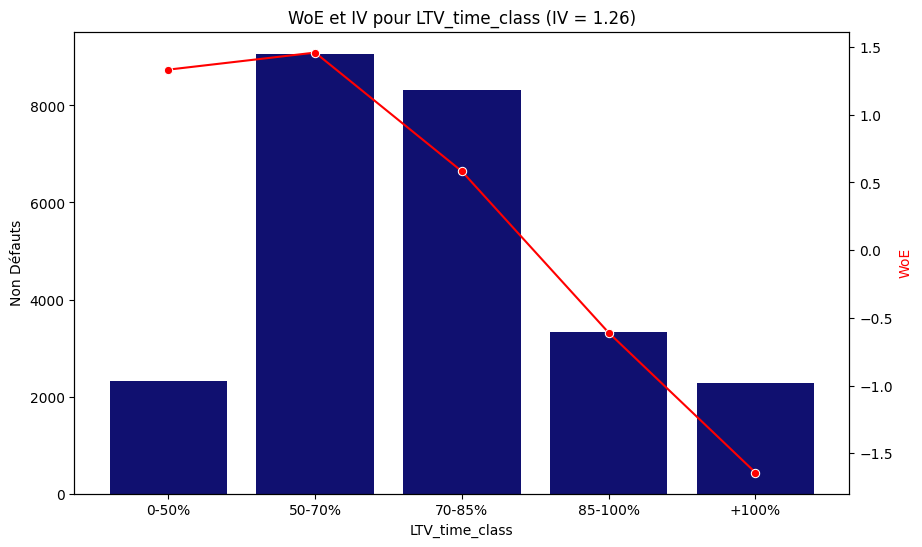

,LTV_time_class,Total,Non_Defauts,Defauts,Share,Taux Defauts,Distribution Non Défauts,Distribution Défauts,WoE,IV
0,0-50%,2673,2329,344,0.067650,0.128694,0.091968,0.024246,1.333197,0.090287
1,50-70%,10250,9069,1181,0.259415,0.115220,0.358119,0.083239,1.459144,0.401089
2,70-85%,10912,8310,2602,0.276169,0.238453,0.328147,0.183394,0.581823,0.084221
3,85-100%,6757,3327,3430,0.171011,0.507622,0.131377,0.241754,-0.609845,0.067312
4,+100%,8920,2289,6631,0.225754,0.743386,0.090389,0.467367,-1.642997,0.619374


In [54]:
variable = "LTV_time_class"  # Remplacez par la variable de votre choix
target = "DEFAUT"

# Calcul du WoE et IV
grouped_data, iv_value = calculate_woe_iv(df_clean, variable, target)

# Affichage du WoE & IV
plot_woe_iv(grouped_data, variable, iv_value)

# Affichage des résultats
grouped_data


In [55]:
def calculate_woe_iv(df_clean, variable, target):
    """Calcule le WoE et l'IV pour une variable donnée."""
    grouped = df.groupby(variable).agg(
        Non_Defauts=(target, lambda x: (x == 0).sum()),
        Defauts=(target, lambda x: (x == 1).sum())
    ).reset_index()

    grouped["Total"] = grouped["Non_Defauts"] + grouped["Defauts"]
    grouped["Distribution_Non_Defauts"] = grouped["Non_Defauts"] / grouped["Non_Defauts"].sum()
    grouped["Distribution_Defauts"] = grouped["Defauts"] / grouped["Defauts"].sum()
    grouped["WoE"] = np.log(grouped["Distribution_Non_Defauts"] / grouped["Distribution_Defauts"])
    grouped["IV"] = (grouped["Distribution_Non_Defauts"] - grouped["Distribution_Defauts"]) * grouped["WoE"]
    
    # Remplacer les infinis par 0
    grouped.replace([np.inf, -np.inf], 0, inplace=True)

    iv_value = grouped["IV"].sum()
    
    return grouped, iv_value


In [56]:
def plot_woe_iv(grouped_data, variable, iv_value):
    """ Génère un graphique combiné pour le WoE et IV """
    
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Barplot pour le nombre de non-défaillants
    sns.barplot(
        x=grouped_data[variable], 
        y=grouped_data["Non_Defauts"], 
        color="navy", 
        ax=ax1
    )
    ax1.set_ylabel("Non Défauts")
    
    # Axe secondaire pour le WoE
    ax2 = ax1.twinx()
    sns.lineplot(
        x=grouped_data[variable], 
        y=grouped_data["WoE"], 
        color="red", 
        marker="o", 
        ax=ax2
    )
    ax2.set_ylabel("WoE", color="red")
    
    plt.title(f"WoE et IV pour {variable} (IV = {iv_value:.2f})")
    plt.xticks(rotation=45)
    plt.show()


C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\453199310.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



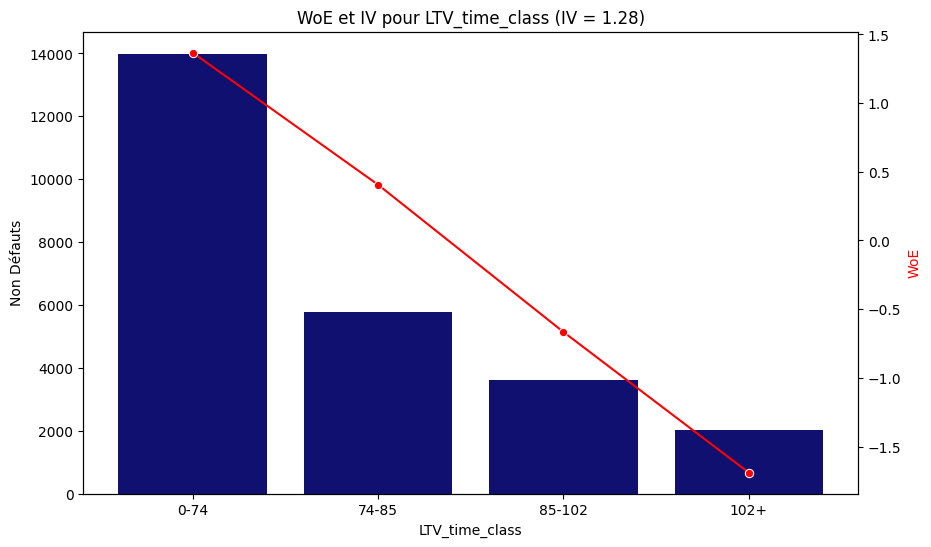

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\453199310.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



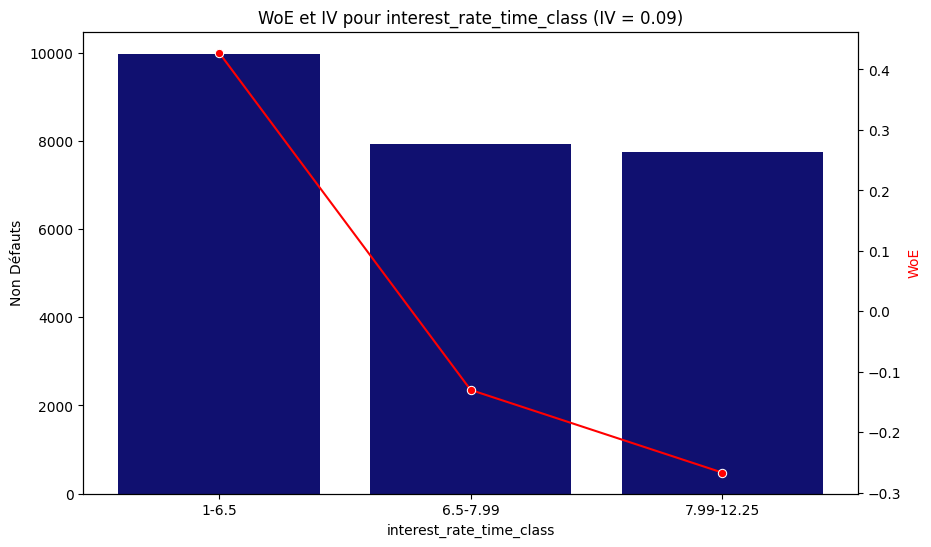

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\453199310.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



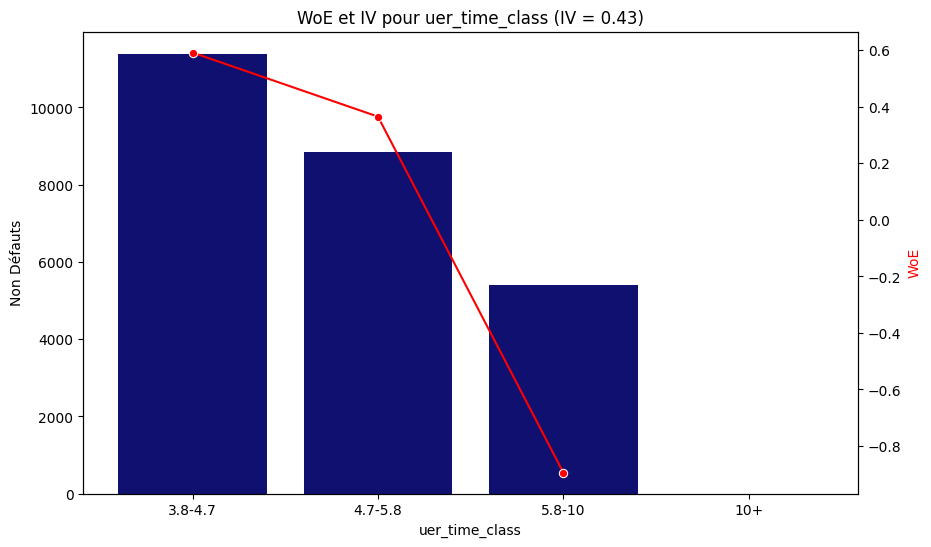

C:\Users\kelia\AppData\Local\Temp\ipykernel_4580\453199310.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



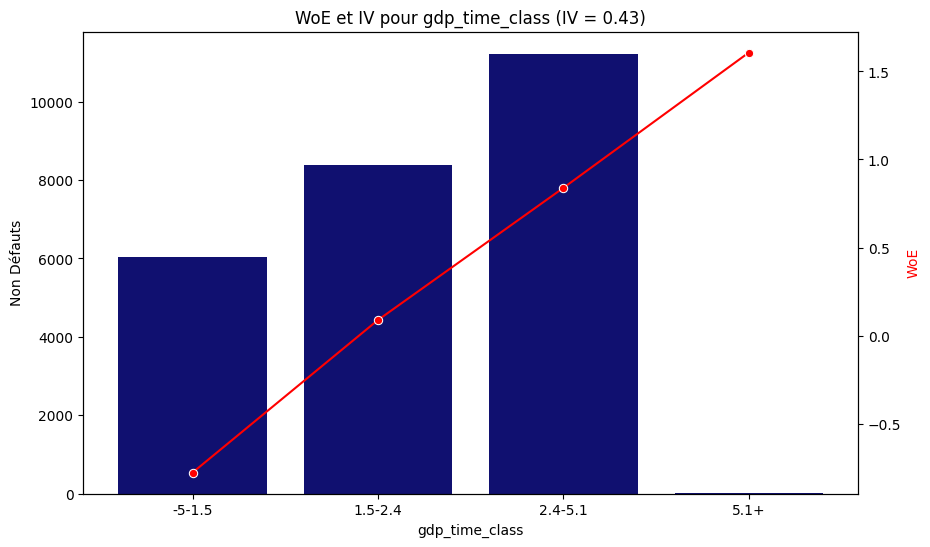

In [57]:
# Liste des variables catégoriques à analyser
variables_to_analyze = ["LTV_time_class", "interest_rate_time_class", "uer_time_class", "gdp_time_class"]

for variable in variables_to_analyze:
    grouped_data, iv_value = calculate_woe_iv(df_clean, variable, "DEFAUT")
    plot_woe_iv(grouped_data, variable, iv_value)


In [58]:
import warnings
import openpyxl

warnings.simplefilter(action='ignore', category=FutureWarning)

# Charger les données
df_clean = pd.read_csv("df_clean.csv")  # Remplace par ton fichier de données

# Identifier les variables catégoriques et numériques
categorical_columns = df_clean.select_dtypes(include=['object']).columns
numerical_columns = df_clean.select_dtypes(exclude=['object']).columns

# Dictionnaire pour stocker les IV
iv_results = {}

# Création du fichier Excel
with pd.ExcelWriter('WoE_IV_Resultats.xlsx', engine='openpyxl', mode='w') as excel_writer:

    # Traitement des variables catégoriques
    for variable in categorical_columns:
        iv, woe_tb = IV_WoE(df_clean, variable, 'DEFAUT')
        iv_results[variable] = iv
        woe_tb.to_excel(excel_writer, sheet_name=variable, index=False, startrow=1, startcol=0)

    # Traitement des variables numériques (binned)
    for variable in numerical_columns:
        if variable != "DEFAUT":
            iv, woe_tb = IV_WoE_Coarse(df_clean, variable, 'DEFAUT')
            iv_results[variable] = iv
            woe_tb.to_excel(excel_writer, sheet_name=variable, index=False, startrow=1, startcol=0)


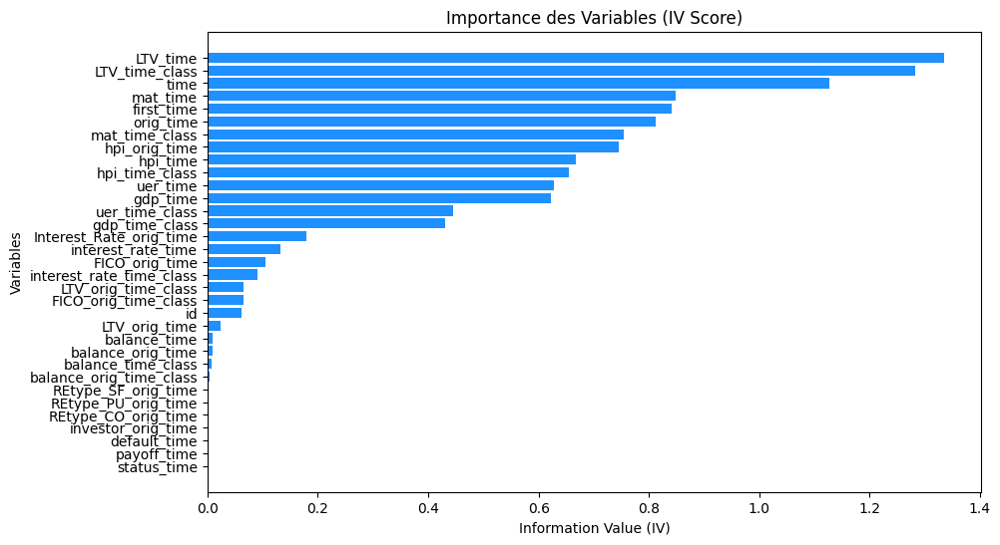

In [59]:
# Transformer le dictionnaire IV en DataFrame
iv_df = pd.DataFrame(list(iv_results.items()), columns=['Variable', 'IV']).sort_values(by="IV", ascending=False)

# Création du graphique
plt.figure(figsize=(10,6))
plt.barh(iv_df["Variable"], iv_df["IV"], color="dodgerblue")
plt.xlabel("Information Value (IV)")
plt.ylabel("Variables")
plt.title("Importance des Variables (IV Score)")
plt.gca().invert_yaxis()
plt.show()


### Croisement de Variables

In [60]:
df_model = df_clean.copy() 

# Recodage de LTV_time**
df_model['g_LTV_time'] = 1
df_model.loc[df_model['LTV_time'] > 80, 'g_LTV_time'] = 2
df_model.loc[df_model['LTV_time'] > 90, 'g_LTV_time'] = 3

# Recodage de FICO_orig_time**
df_model['g_FICO_orig_time'] = 1
df_model.loc[df_model['FICO_orig_time'] > 650, 'g_FICO_orig_time'] = 2
df_model.loc[df_model['FICO_orig_time'] > 700, 'g_FICO_orig_time'] = 3

# Recodage de interest_rate_time**
df_model['g_interest_rate_time'] = 1
df_model.loc[df_model['interest_rate_time'] > 3, 'g_interest_rate_time'] = 2
df_model.loc[df_model['interest_rate_time'] > 6, 'g_interest_rate_time'] = 3

# Recodage de investor_orig_time**
df_model['g_investor_orig_time'] = 1
df_model.loc[df_model['investor_orig_time'] > 1, 'g_investor_orig_time'] = 2

# Recodage de hpi_time**
df_model['g_hpi_time'] = 1
df_model.loc[df_model['hpi_time'] < 100, 'g_hpi_time'] = 2

# Recodage de gdp_time**
df_model['g_gdp_time'] = 1
df_model.loc[df_model['gdp_time'] < 2, 'g_gdp_time'] = 2

# Recodage de uer_time (taux de chômage)**
df_model['g_uer_time'] = 1
df_model.loc[df_model['uer_time'] > 6, 'g_uer_time'] = 2
df_model.loc[df_model['uer_time'] > 8, 'g_uer_time'] = 3

# Recodage de REtype_CO_orig_time**
df_model['g_REtype_CO_orig_time'] = 1
df_model.loc[df_model['REtype_CO_orig_time'] == 1, 'g_REtype_CO_orig_time'] = 2

# Recodage de REtype_PU_orig_time**
df_model['g_REtype_PU_orig_time'] = 1
df_model.loc[df_model['REtype_PU_orig_time'] == 1, 'g_REtype_PU_orig_time'] = 2

#  Recodage de REtype_SF_orig_time**
df_model['g_REtype_SF_orig_time'] = 1
df_model.loc[df_model['REtype_SF_orig_time'] == 1, 'g_REtype_SF_orig_time'] = 2

# Recodage de balance_orig_time**
df_model['g_balance_orig_time'] = 1
df_model.loc[df_model['balance_orig_time'] > 50000, 'g_balance_orig_time'] = 2

# Recodage de mat_time (maturité du prêt)**
df_model['g_mat_time'] = 1
df_model.loc[df_model['mat_time'] > 200, 'g_mat_time'] = 2
df_model.loc[df_model['mat_time'] > 300, 'g_mat_time'] = 3

# Recodage de default_time**
df_model['g_default_time'] = df_model['default_time']

# Recodage de payoff_time**
df_model['g_payoff_time'] = df_model['payoff_time']

# Recodage de status_time**
df_model['g_status_time'] = df_model['status_time']


# Liste des nouvelles variables groupées**
var_grp = [
    'DEFAUT', 'g_LTV_time', 'g_FICO_orig_time', 'g_interest_rate_time', 'g_investor_orig_time',
    'g_hpi_time', 'g_gdp_time', 'g_uer_time', 'g_REtype_CO_orig_time', 'g_REtype_PU_orig_time',
    'g_REtype_SF_orig_time', 'g_balance_orig_time', 'g_mat_time', 'g_default_time',
    'g_payoff_time', 'g_status_time'
]

df_model = df_model[var_grp]  # On garde uniquement ces variables recodées

# Aperçu du DataFrame recodé**
print(df_model.head())


   DEFAUT  g_LTV_time  g_FICO_orig_time  g_interest_rate_time  \
0     1.0           1                 3                     3   
1     0.0           1                 1                     3   
2     0.0           1                 2                     3   
3     0.0           1                 1                     3   
4     1.0           1                 2                     3   

   g_investor_orig_time  g_hpi_time  g_gdp_time  g_uer_time  \
0                     1           1           1           3   
1                     1           1           1           1   
2                     1           1           2           1   
3                     1           1           1           1   
4                     1           1           2           2   

   g_REtype_CO_orig_time  g_REtype_PU_orig_time  g_REtype_SF_orig_time  \
0                      1                      1                      2   
1                      1                      1                      2   
2       

In [61]:
# Copie du dataset pour modification
df_model = df_clean.copy()

# 🔹 1. Croisement balance_time & investor_orig_time (IV faible mais pertinent)
df_model['balance_investor'] = 'B1_I1'
df_model.loc[(df_model['balance_time'] > df_model['balance_time'].median()) & 
             (df_model['investor_orig_time'] == 1), 'balance_investor'] = 'B2_I1'
df_model.loc[(df_model['balance_time'] > df_model['balance_time'].median()) & 
             (df_model['investor_orig_time'] == 0), 'balance_investor'] = 'B2_I0'

# 🔹 2. Croisement FICO_orig_time & LTV_time (Pouvoir combiné plus fort)
df_model['fico_ltv'] = 'F1_L1'
df_model.loc[(df_model['FICO_orig_time'] > 700) & (df_model['LTV_time'] > 90), 'fico_ltv'] = 'F3_L3'
df_model.loc[(df_model['FICO_orig_time'] <= 700) & (df_model['LTV_time'] > 90), 'fico_ltv'] = 'F2_L3'
df_model.loc[(df_model['FICO_orig_time'] > 700) & (df_model['LTV_time'] <= 90), 'fico_ltv'] = 'F3_L2'

# 🔹 3. Croisement hpi_time & gdp_time (Impact économique)
df_model['hpi_gdp'] = 'H1_G1'
df_model.loc[(df_model['hpi_time'] > df_model['hpi_time'].median()) & 
             (df_model['gdp_time'] > df_model['gdp_time'].median()), 'hpi_gdp'] = 'H2_G2'
df_model.loc[(df_model['hpi_time'] <= df_model['hpi_time'].median()) & 
             (df_model['gdp_time'] > df_model['gdp_time'].median()), 'hpi_gdp'] = 'H1_G2'
df_model.loc[(df_model['hpi_time'] > df_model['hpi_time'].median()) & 
             (df_model['gdp_time'] <= df_model['gdp_time'].median()), 'hpi_gdp'] = 'H2_G1'

# Vérification des nouvelles variables créées
print(df_model[['balance_investor', 'fico_ltv', 'hpi_gdp']].head())

# Fonction pour calculer l'IV et WoE
def IV_WoE(df, var, target):
    """Calcule l'Information Value (IV) et le Weight of Evidence (WoE) d'une variable catégorielle."""
    lst = []
    for val in df[var].unique():
        total = df[df[var] == val].shape[0]
        non_defauts = df[(df[var] == val) & (df[target] == 0)].shape[0]
        defauts = df[(df[var] == val) & (df[target] == 1)].shape[0]

        # Calcul des ratios
        dist_non_defauts = non_defauts / df[df[target] == 0].shape[0]
        dist_defauts = defauts / df[df[target] == 1].shape[0]

        # Calcul du WoE et IV
        woe = np.log((dist_non_defauts + 1e-10) / (dist_defauts + 1e-10))  # Éviter log(0)
        iv = (dist_non_defauts - dist_defauts) * woe

        lst.append([val, total, non_defauts, defauts, woe, iv])

    woe_tb = pd.DataFrame(lst, columns=['Groupes', 'Total', 'Non Défauts', 'Défauts', 'WoE', 'IV'])
    iv_total = woe_tb['IV'].sum()

    return iv_total, woe_tb

# Calcul du WoE & IV pour les nouvelles variables croisées
for var in ['balance_investor', 'fico_ltv', 'hpi_gdp']:
    iv_value, woe_tb = IV_WoE(df_model, var, 'DEFAUT')
    print(f"\n IV de {var} : {iv_value:.2f}")
    display(woe_tb.style.background_gradient(subset=['WoE'], cmap='RdYlGn', axis=None))


  balance_investor fico_ltv hpi_gdp
0            B1_I1    F3_L2   H1_G2
1            B1_I1    F1_L1   H2_G1
2            B1_I1    F1_L1   H2_G1
3            B1_I1    F1_L1   H2_G2
4            B1_I1    F1_L1   H1_G1

 IV de balance_investor : 0.01


,Groupes,Total,Non Défauts,Défauts,WoE,IV
0,B1_I1,19756,13065,6691,0.089818,0.003981
1,B2_I0,19756,12259,7497,-0.087599,0.003882



 IV de fico_ltv : 1.17


,Groupes,Total,Non Défauts,Défauts,WoE,IV
0,F3_L2,7859,7075,784,1.620558,0.363201
1,F1_L1,18418,14042,4376,0.586562,0.144332
2,F2_L3,9084,2515,6569,-1.539445,0.559871
3,F3_L3,4151,1692,2459,-0.953200,0.101517



 IV de hpi_gdp : 0.70


,Groupes,Total,Non Défauts,Défauts,WoE,IV
0,H1_G2,6131,4024,2107,0.067655,0.000703
1,H2_G1,7355,5329,2026,0.387744,0.026225
2,H2_G2,12088,10294,1794,1.167757,0.327027
3,H1_G1,13938,5677,8261,-0.954479,0.341778


✅ Variables Conservées :
LTV_time (~1.35)
LTV_time_class (~1.3)
time (~0.85)
mat_time (~0.8)
first_time (~0.75)
orig_time (~0.7)
mat_time_class (~0.65)
hpi_orig_time (~0.6)
hpi_time (~0.55)
uer_time (~0.5)
hpi_time_class (~0.45)
gdp_time (~0.4)
uer_time_class (~0.35)
gdp_time_class (~0.3)
Interest_Rate_orig_time (~0.25)
fico_ltv (~1.17 → Fort pouvoir prédictif ! 🚀)
hpi_gdp (~0.70 → Très utile pour capturer les tendances économiques 📉)



❌ Variables Supprimées (IV < 0.2) :
interest_rate_time (~0.1 → Trop faible)
FICO_orig_time (~0.1 → Peu discriminant seul, mais utile combiné avec LTV)
LTV_orig_time_class (~0.05 → Peu utile seul)
balance_time, balance_orig_time (< 0.05 → Aucun pouvoir prédictif)
Variables catégoriques avec IV faible (REtype_x, investor_orig_time, payoff_time, status_time, etc.)

In [62]:
# Liste des variables sélectionnées
selected_vars = [
    "LTV_time", "LTV_time_class", "time", "mat_time", "first_time", "orig_time",
    "mat_time_class", "hpi_orig_time", "hpi_time", "uer_time", "hpi_time_class",
    "gdp_time", "uer_time_class", "gdp_time_class", "Interest_Rate_orig_time",
    "fico_ltv", "hpi_gdp", "DEFAUT", "balance_time"  # Garder la variable cible
]




In [63]:
# Création du DataFrame filtré
df_model1 = df_model[selected_vars].copy()
print(df_model1.head())

    LTV_time LTV_time_class  time  mat_time  first_time  orig_time  \
0  26.658065           0-74  48.0     141.0        25.0       21.0   
1  65.469851           0-74  26.0     138.0        25.0       18.0   
2  31.459735           0-74  29.0     141.0        25.0       21.0   
3  66.346343           0-74  27.0     138.0        25.0       18.0   
4  75.834755          74-85  30.0     139.0        25.0       19.0   

  mat_time_class  hpi_orig_time  hpi_time  uer_time hpi_time_class  gdp_time  \
0         23-137         208.86    146.45       8.3        107-159  2.715903   
1        138-143         186.91    225.10       4.7           220+  2.151365   
2         23-137         208.86    217.37       4.5        209-220  1.692969   
3        138-143         186.91    222.39       4.4           220+  2.361722   
4        138-143         191.42    181.43       6.6        180-209  1.717053   

  uer_time_class gdp_time_class  Interest_Rate_orig_time fico_ltv hpi_gdp  \
0         5.8-10     

# 4) Modélisation

In [64]:
cat_vars = [
    "LTV_time_class", "mat_time_class", "hpi_time_class", 
    "uer_time_class", "gdp_time_class", "fico_ltv", "hpi_gdp"
]


In [65]:
df_dummies = pd.get_dummies(df_model1[cat_vars], drop_first=True)


In [66]:
df_model_final = pd.concat([df_model1[cat_vars], df_dummies, df_model1["DEFAUT"]], axis=1)


## Régression Logistique

In [67]:
from sklearn.model_selection import train_test_split

X = df_model_final.drop("DEFAUT", axis=1)
y = df_model_final["DEFAUT"]


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print("Split terminé : ", X_train.shape, X_test.shape)


Split terminé :  (27658, 26) (11854, 26)


In [68]:
import statsmodels.api as sm

# Ajouter une constante pour l'intercept
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)


# Définition des variables explicatives (X) et cible (y)
X = X_train
y = y_train

In [69]:
print(X.dtypes.value_counts())  #
print(X.select_dtypes(include=['object']).head())  


bool       19
object      7
float64     1
Name: count, dtype: int64
      LTV_time_class mat_time_class hpi_time_class uer_time_class  \
31128          74-85        138-143        159-180         5.8-10   
31712           0-74        138-143        209-220        4.7-5.8   
7511            0-74         23-137        180-209        4.7-5.8   
12804           0-74         23-137        209-220        4.7-5.8   
28233           102+        144-186        107-159         5.8-10   

      gdp_time_class fico_ltv hpi_gdp  
31128        2.4-5.1    F1_L1   H1_G2  
31712        2.4-5.1    F3_L2   H2_G2  
7511         2.4-5.1    F1_L1   H1_G2  
12804        2.4-5.1    F1_L1   H2_G2  
28233         -5-1.5    F2_L3   H1_G1  


In [70]:
# Séparer les colonnes numériques et catégoriques
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Convertir seulement les numériques
X[numerical_cols] = X[numerical_cols].astype(int)

# Séparer les colonnes numériques et catégoriques
numerical_cols = X_test.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_test.select_dtypes(include=['object']).columns

# Convertir seulement les numériques
X_test[numerical_cols] = X_test[numerical_cols].astype(int)


In [71]:
# Encodage one-hot des variables catégoriques
X = pd.get_dummies(X, drop_first=True)

# Vérifier les types de données
print(X.dtypes.value_counts())  # Il ne doit rester que du int64 et float64


# Encodage one-hot des variables catégoriques
X_test= pd.get_dummies(X_test, drop_first=True)

# Vérifier les types de données
print(X_test.dtypes.value_counts())  


bool     38
int64     1
Name: count, dtype: int64
bool     38
int64     1
Name: count, dtype: int64


In [72]:
# Convertir toutes les colonnes booléennes en int (0 et 1)
X = X.astype({col: int for col in X.select_dtypes(include=['bool']).columns})

# Convertir toutes les colonnes booléennes en int (0 et 1)
X_test = X_test.astype({col: int for col in X_test.select_dtypes(include=['bool']).columns})


In [73]:
X = X.loc[:, ~X.columns.duplicated()]  # Supprime les doublons
X = X.astype(int)  # Convertit tout en int

X_test = X_test.loc[:, ~X_test.columns.duplicated()]  # Supprime les doublons
X_test = X_test.astype(int)  # Convertit tout en int

In [74]:
print(X.dtypes.value_counts())  # Vérifier qu'on a bien du int64 / float64
print(X_test.dtypes.value_counts())  # Vérifier qu'on a bien du int64 / float64


int64    20
Name: count, dtype: int64
int64    20
Name: count, dtype: int64


In [75]:
# Estimer le modèle logistique
logit_model = sm.Logit(y, X)
logit_res = logit_model.fit()

# Afficher les résultats
print(logit_res.summary2())


Optimization terminated successfully.
         Current function value: 0.480238
         Iterations 6
                            Results: Logit
Model:                Logit              Method:             MLE       
Dependent Variable:   DEFAUT             Pseudo R-squared:   0.264     
Date:                 2025-03-02 21:59   AIC:                26604.8375
No. Observations:     27658              BIC:                26769.3909
Df Model:             19                 Log-Likelihood:     -13282.   
Df Residuals:         27638              LL-Null:            -18057.   
Converged:            1.0000             LLR p-value:        0.0000    
No. Iterations:       6.0000             Scale:              1.0000    
-----------------------------------------------------------------------
                        Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
-----------------------------------------------------------------------
const                  -0.1426   0.1138  -1.2534 0.2100 -0.3657

In [76]:
# Calcul de l'Odds Ratio avec intervalle de confiance
params = logit_res.params
conf = logit_res.conf_int()
conf["OR"] = params
conf.columns = ["Lower CI", "Upper CI", "OR"]
conf["OR"] = np.exp(conf["OR"])  # Transformation exponentielle

print(conf)  # Affichage du tableau des Odds Ratios


                        Lower CI  Upper CI        OR
const                  -0.365677  0.080400  0.867068
LTV_time_class_102+     1.251989  1.587869  4.136827
LTV_time_class_74-85    0.552937  0.742263  1.910949
LTV_time_class_85-102   0.798607  1.060520  2.533404
mat_time_class_144-186  0.402044  0.547149  1.607366
mat_time_class_23-137  -0.397117 -0.198336  0.742504
hpi_time_class_159-180 -0.225763 -0.018692  0.884947
hpi_time_class_180-209 -0.394378 -0.123099  0.772025
hpi_time_class_209-220 -1.007153 -0.626065  0.441928
hpi_time_class_220+    -1.437996 -1.037521  0.290034
uer_time_class_4.7-5.8 -0.827076 -0.481717  0.519756
uer_time_class_5.8-10  -0.559356 -0.171784  0.693801
gdp_time_class_1.5-2.4 -0.166993  0.034998  0.936133
gdp_time_class_2.4-5.1 -0.512893 -0.147297  0.718856
fico_ltv_F2_L3          0.184086  0.451298  1.373954
fico_ltv_F3_L2         -1.381022 -1.171824  0.279034
fico_ltv_F3_L3         -0.463104 -0.171992  0.727932
hpi_gdp_H1_G2          -0.300396  0.066047  0.

In [77]:
logreg = LogisticRegression(class_weight='balanced')
logreg.fit(X, y)

LogisticRegression(class_weight='balanced')

In [78]:
y_pred = logreg.predict(X_test)
print('Efficacité du classifieur de la régression logistiquee sur l\'ensemble de test : {:.2f}'.format(logreg.score(X_test, y_test)))

Efficacité du classifieur de la régression logistiquee sur l'ensemble de test : 0.77


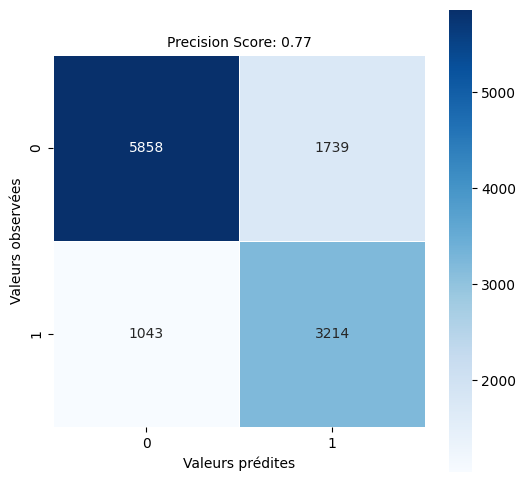

In [79]:
from sklearn.metrics import confusion_matrix

# Prédiction sur l'ensemble de test
y_pred = logreg.predict(X_test)

# Calcul de la matrice de confusion
cm = confusion_matrix(y_test, y_pred)

# Score du modèle
score = logreg.score(X_test, y_test)

# Affichage de la heatmap
plt.figure(figsize=(6,6))
sns.heatmap(cm, annot=True, fmt="d", linewidths=.5, square=True, cmap='Blues')

plt.ylabel('Valeurs observées')
plt.xlabel('Valeurs prédites')

# Titre avec le score de précision
plt.title(f'Precision Score: {score:.2f}', size=10)

# Affichage du graphique
plt.show()


In [80]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.85      0.77      0.81      7597
         1.0       0.65      0.75      0.70      4257

    accuracy                           0.77     11854
   macro avg       0.75      0.76      0.75     11854
weighted avg       0.78      0.77      0.77     11854



In [81]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(logreg, X, y_train, cv=5)
scores = pd.Series(scores)
scores.describe()

count    5.000000
mean     0.765674
std      0.005579
min      0.758134
25%      0.763738
50%      0.765546
75%      0.767492
max      0.773459
dtype: float64

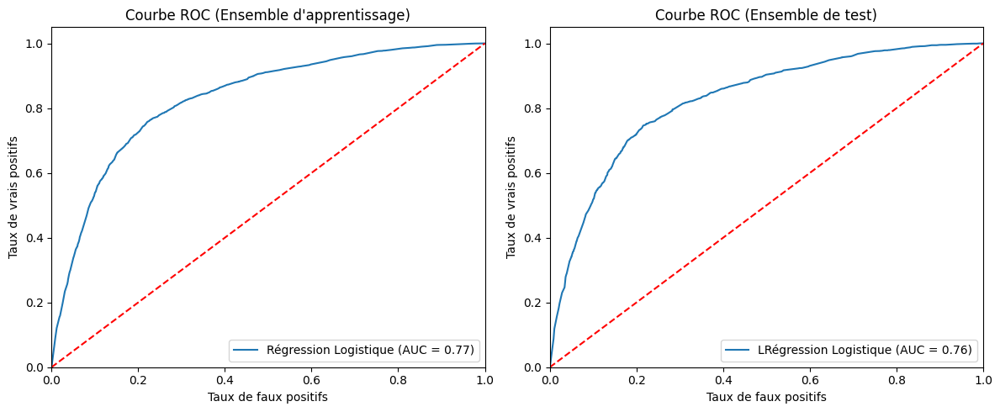

In [82]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

# ROC AUC pour l'ensemble d'apprentissage
logit_roc_auc_train = roc_auc_score(y_train, logreg.predict(X))
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, logreg.predict_proba(X)[:,1])

# ROC AUC pour l'ensemble de test
logit_roc_auc_test = roc_auc_score(y_test, logreg.predict(X_test))
fpr_test, tpr_test, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])


plt.figure(figsize=(12, 5))

# Graph pour l'ensemble d'apprentissage
plt.subplot(1, 2, 1)
plt.plot(fpr_train, tpr_train, label='Régression Logistique (AUC = %0.2f)' % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC (Ensemble d\'apprentissage)')
plt.legend(loc="lower right")

# Graph pour l'ensemble de test
plt.subplot(1, 2, 2)
plt.plot(fpr_test, tpr_test, label='LRégression Logistique (AUC = %0.2f)' % logit_roc_auc_test)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC (Ensemble de test)')
plt.legend(loc="lower right")


plt.tight_layout()
plt.savefig('ROC_Curves_Side_By_Side')
plt.show()

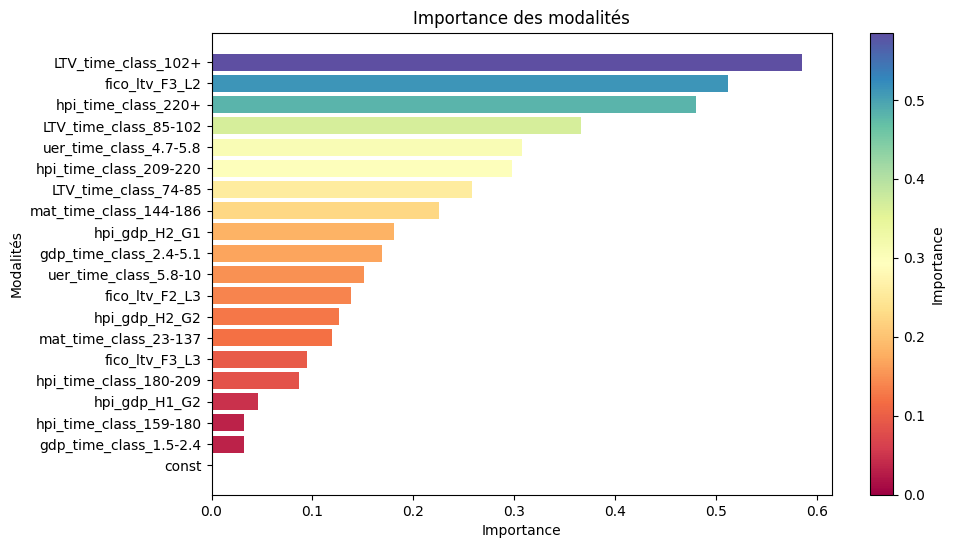

In [83]:
from matplotlib.cm import ScalarMappable

coefficients = logreg.coef_[0]
feature_names = X.columns

feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': np.std(X, 0) * abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)

cmap = plt.get_cmap('Spectral')

norm = plt.Normalize(feature_importance['Importance'].min(), feature_importance['Importance'].max())


sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])


fig, ax = plt.subplots(figsize=(10, 6))  
bars = ax.barh(feature_importance['Feature'], feature_importance['Importance'], color=cmap(norm(feature_importance['Importance'])))
ax.set_xlabel('Importance')
ax.set_ylabel('Modalités')
ax.set_title('Importance des modalités')


cbar = plt.colorbar(sm, ax=ax)  
cbar.set_label('Importance')

plt.show()

## Random Forest

Accuracy: 0.775097013666273

 Rapport de classification :
               precision    recall  f1-score   support

         0.0       0.85      0.79      0.82      7597
         1.0       0.67      0.75      0.71      4257

    accuracy                           0.78     11854
   macro avg       0.76      0.77      0.76     11854
weighted avg       0.78      0.78      0.78     11854



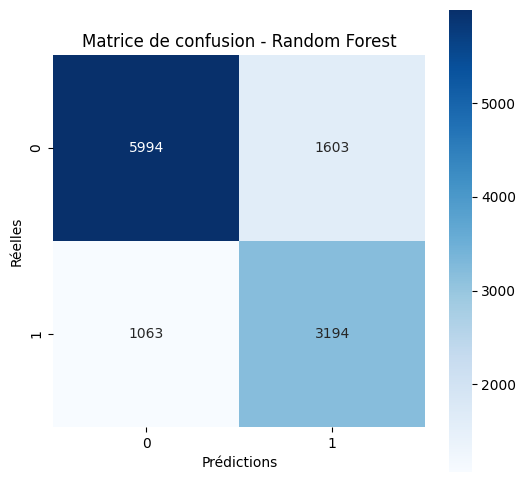

In [84]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Initialisation du modèle Random Forest
rf_model = RandomForestClassifier(
    n_estimators=100,  # Nombre d'arbres
    max_depth=10,  # Profondeur max des arbres
    min_samples_split=5,  # Nombre min d'échantillons pour diviser un nœud
    min_samples_leaf=2,  # Nombre min d'échantillons dans une feuille
    class_weight="balanced",  # Gérer le déséquilibre de classes
    random_state=1234,
    n_jobs=-1  # Utiliser tous les cœurs du processeur
)

# Entraînement du modèle
rf_model.fit(X, y_train)

# 🔍 Prédiction sur l'ensemble de test
y_pred_rf = rf_model.predict(X_test)

# Évaluation du modèle
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\n Rapport de classification :\n", classification_report(y_test, y_pred_rf))

# Matrice de confusion
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(6, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt="d", cmap="Blues", square=True)
plt.xlabel("Prédictions")
plt.ylabel("Réelles")
plt.title("Matrice de confusion - Random Forest")
plt.show()


In [85]:
scores = cross_val_score(rf_model, X, y_train, cv=5)
scores = pd.Series(scores)
scores.describe()

count    5.000000
mean     0.774134
std      0.003481
min      0.768619
25%      0.773278
50%      0.775307
75%      0.775628
max      0.777838
dtype: float64

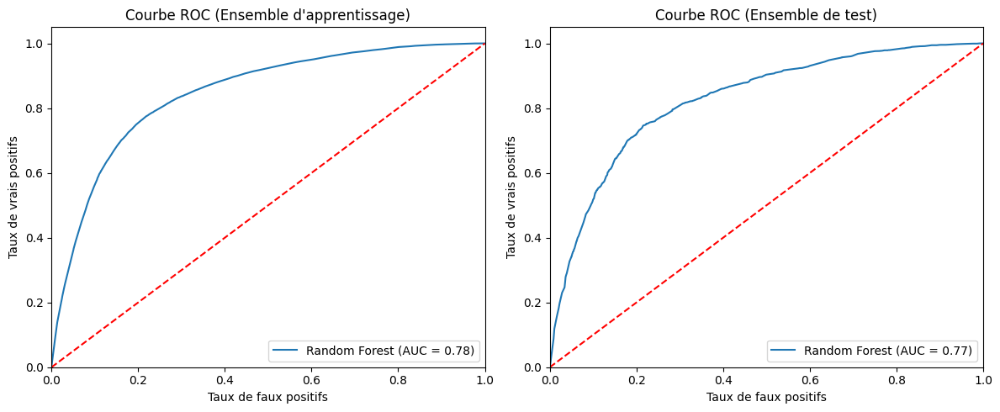

In [86]:

# ROC AUC pour l'ensemble d'apprentissage
rf_roc_auc_train = roc_auc_score(y_train, rf_model.predict(X))
fpr_train2, tpr_train2, thresholds_train2 = roc_curve(y_train, rf_model.predict_proba(X)[:,1])

# ROC AUC pour l'ensemble de test
rf_roc_auc_test = roc_auc_score(y_test, rf_model.predict(X_test))
fpr_test2, tpr_test2, thresholds = roc_curve(y_test, rf_model.predict_proba(X_test)[:,1])


plt.figure(figsize=(12, 5))

# Graph pour l'ensemble d'apprentissage
plt.subplot(1, 2, 1)
plt.plot(fpr_train2, tpr_train2, label='Random Forest (AUC = %0.2f)' % rf_roc_auc_train)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC (Ensemble d\'apprentissage)')
plt.legend(loc="lower right")

# Graph pour l'ensemble de test
plt.subplot(1, 2, 2)
plt.plot(fpr_test, tpr_test, label='Random Forest (AUC = %0.2f)' % rf_roc_auc_test)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC (Ensemble de test)')
plt.legend(loc="lower right")


plt.tight_layout()
plt.savefig('ROC_Curves_Side_By_Side')
plt.show()

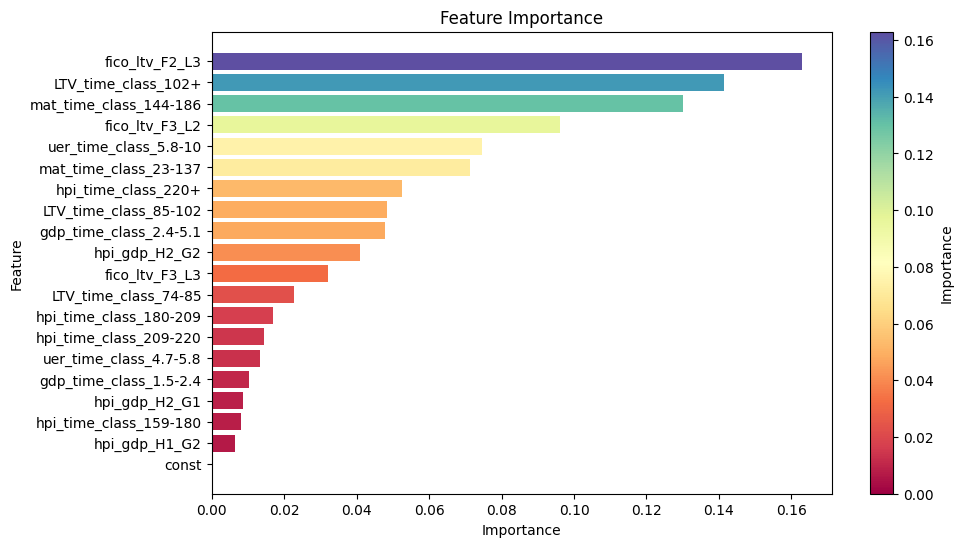

In [87]:
from matplotlib.cm import ScalarMappable

feature_importances = rf_model.feature_importances_
feature_names = X.columns

feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance = feature_importance.sort_values('Importance', ascending=True)

cmap = plt.get_cmap('Spectral')
norm = plt.Normalize(feature_importance['Importance'].min(), feature_importance['Importance'].max())

sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(feature_importance['Feature'], feature_importance['Importance'], color=cmap(norm(feature_importance['Importance'])))
ax.set_xlabel('Importance')
ax.set_ylabel('Feature')
ax.set_title('Feature Importance')

cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Importance')

plt.show()

## Construction d'une grille de score

In [88]:
# Liste des variables à supprimer
variables_a_supprimer = [
    'LTV_time_class', 'mat_time_class', 'hpi_time_class',
    'uer_time_class', 'gdp_time_class', 'fico_ltv', 'hpi_gdp'
]

# Suppression des variables dans le dataset
df_model_final1 = df_model_final.drop(columns=variables_a_supprimer, errors='ignore')

# Vérification des colonnes restantes
print("Colonnes après suppression :", df_model_final1.columns.tolist())


Colonnes après suppression : ['LTV_time_class_102+', 'LTV_time_class_74-85', 'LTV_time_class_85-102', 'mat_time_class_144-186', 'mat_time_class_23-137', 'hpi_time_class_159-180', 'hpi_time_class_180-209', 'hpi_time_class_209-220', 'hpi_time_class_220+', 'uer_time_class_4.7-5.8', 'uer_time_class_5.8-10', 'gdp_time_class_1.5-2.4', 'gdp_time_class_2.4-5.1', 'fico_ltv_F2_L3', 'fico_ltv_F3_L2', 'fico_ltv_F3_L3', 'hpi_gdp_H1_G2', 'hpi_gdp_H2_G1', 'hpi_gdp_H2_G2', 'DEFAUT']


In [89]:
X1 = df_model_final1.drop("DEFAUT", axis=1)
y1 = df_model_final1["DEFAUT"]

columns_list = X1.columns.tolist()
print(columns_list)


['LTV_time_class_102+', 'LTV_time_class_74-85', 'LTV_time_class_85-102', 'mat_time_class_144-186', 'mat_time_class_23-137', 'hpi_time_class_159-180', 'hpi_time_class_180-209', 'hpi_time_class_209-220', 'hpi_time_class_220+', 'uer_time_class_4.7-5.8', 'uer_time_class_5.8-10', 'gdp_time_class_1.5-2.4', 'gdp_time_class_2.4-5.1', 'fico_ltv_F2_L3', 'fico_ltv_F3_L2', 'fico_ltv_F3_L3', 'hpi_gdp_H1_G2', 'hpi_gdp_H2_G1', 'hpi_gdp_H2_G2']


In [90]:


# Vérification des dimensions
print(f"Shape de X1 : {X1.shape}")  # (N, nombre de variables)
print(f"Shape de y1 : {y1.shape}")  # (N,)

Shape de X1 : (39512, 19)
Shape de y1 : (39512,)


In [91]:

print(type(X1))  
print(X1.dtypes) 


for col in X1.columns:
    print(f"{col} - Valeurs uniques: {X1[col].unique()[:10]}") 


<class 'pandas.core.frame.DataFrame'>
LTV_time_class_102+       bool
LTV_time_class_74-85      bool
LTV_time_class_85-102     bool
mat_time_class_144-186    bool
mat_time_class_23-137     bool
hpi_time_class_159-180    bool
hpi_time_class_180-209    bool
hpi_time_class_209-220    bool
hpi_time_class_220+       bool
uer_time_class_4.7-5.8    bool
uer_time_class_5.8-10     bool
gdp_time_class_1.5-2.4    bool
gdp_time_class_2.4-5.1    bool
fico_ltv_F2_L3            bool
fico_ltv_F3_L2            bool
fico_ltv_F3_L3            bool
hpi_gdp_H1_G2             bool
hpi_gdp_H2_G1             bool
hpi_gdp_H2_G2             bool
dtype: object
LTV_time_class_102+ - Valeurs uniques: [False  True]
LTV_time_class_74-85 - Valeurs uniques: [False  True]
LTV_time_class_85-102 - Valeurs uniques: [False  True]
mat_time_class_144-186 - Valeurs uniques: [False  True]
mat_time_class_23-137 - Valeurs uniques: [ True False]
hpi_time_class_159-180 - Valeurs uniques: [False  True]
hpi_time_class_180-209 - Valeu

In [92]:
X1 = X1.astype(int)

In [93]:
from optbinning import BinningProcess
import ortools

load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\zlib1.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\abseil_dll.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\utf8_validity.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\re2.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\libprotobuf.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\highs.dll...
load c:\Users\kelia\AppData\Local\Programs\Python\Python313\Lib\site-packages\ortools\.libs\ortools.dll...
(CVXPY) Mar 02 09:59:39 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.12.4544). Expected < 9.12.0. Please open a feature request on cvxpy to enable support for this version.')
(CV

In [94]:

# Vérifier les types
print(f"Type de X1 : {type(X1)}")
print(f"Type de y1 : {type(y1)}")
print(f"Types des colonnes de X1 : \n{X1.dtypes}")

# Convertir bool → int (si ce n'est pas encore fait)
X1 = X1.astype(int)

# Vérifier la présence de NaN et les supprimer
print(f"Nombre de NaN dans X1 : {X1.isnull().sum().sum()}")
print(f"Nombre de NaN dans y1 : {y1.isnull().sum()}")


X1 = X1.dropna()
y1 = y1.loc[X1.index]  


X1 = X1.to_numpy(dtype=np.float64)  
y1 = y1.to_numpy(dtype=np.int32)  

# Vérifier les nouvelles dimensions et types
print(f"Shape de X1 après conversion : {X1.shape}")
print(f"Shape de y1 après conversion : {y1.shape}")
print(f"Type de X1 après conversion : {type(X1)}")
print(f"Type de y1 après conversion : {type(y1)}")


Type de X1 : <class 'pandas.core.frame.DataFrame'>
Type de y1 : <class 'pandas.core.series.Series'>
Types des colonnes de X1 : 
LTV_time_class_102+       int64
LTV_time_class_74-85      int64
LTV_time_class_85-102     int64
mat_time_class_144-186    int64
mat_time_class_23-137     int64
hpi_time_class_159-180    int64
hpi_time_class_180-209    int64
hpi_time_class_209-220    int64
hpi_time_class_220+       int64
uer_time_class_4.7-5.8    int64
uer_time_class_5.8-10     int64
gdp_time_class_1.5-2.4    int64
gdp_time_class_2.4-5.1    int64
fico_ltv_F2_L3            int64
fico_ltv_F3_L2            int64
fico_ltv_F3_L3            int64
hpi_gdp_H1_G2             int64
hpi_gdp_H2_G1             int64
hpi_gdp_H2_G2             int64
dtype: object
Nombre de NaN dans X1 : 0
Nombre de NaN dans y1 : 0
Shape de X1 après conversion : (39512, 19)
Shape de y1 après conversion : (39512,)
Type de X1 après conversion : <class 'numpy.ndarray'>
Type de y1 après conversion : <class 'numpy.ndarray'>


In [95]:
from sklearn.linear_model import LogisticRegression


estimator = LogisticRegression(solver="lbfgs", class_weight="balanced")

# Entraînement du modèle
estimator.fit(X1, y1)

# Calcul des probabilités de défaut
df_model_final1["score"] = estimator.predict_proba(X1)[:, 1] * 100  # Score entre 0 et 100

# Affichage des scores
print(df_model_final1[["score"]].head())



       score
0  12.501224
1  20.620664
2  24.244577
3  23.466815
4  61.098251


In [96]:

X1 = pd.DataFrame(X1, columns=[f"Var_{i}" for i in range(X1.shape[1])])  # Convertir en DataFrame

# Récupération des coefficients
coefficients = pd.DataFrame({
    "Variable": X1.columns,
    "Coefficient": estimator.coef_[0]
})

# Affichage des coefficients
print(coefficients.sort_values(by="Coefficient", ascending=False))

   Variable  Coefficient
0     Var_0     1.493275
2     Var_2     1.000320
1     Var_1     0.644626
3     Var_3     0.498167
13   Var_13     0.273927
11   Var_11    -0.020312
5     Var_5    -0.067873
16   Var_16    -0.170869
6     Var_6    -0.182332
4     Var_4    -0.218537
10   Var_10    -0.284466
18   Var_18    -0.296343
12   Var_12    -0.316179
15   Var_15    -0.373384
17   Var_17    -0.462150
9     Var_9    -0.650390
7     Var_7    -0.732246
8     Var_8    -1.159411
14   Var_14    -1.249675


In [97]:
# Calcul des percentiles pour adapter les seuils
quantiles = df_model_final1["score"].quantile([0, 0.25, 0.5, 0.75, 1]).values

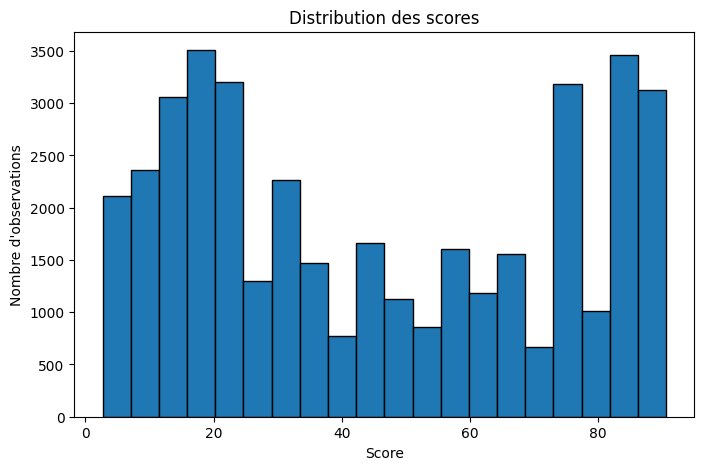

In [98]:

# Histogramme des scores
plt.figure(figsize=(8, 5))
plt.hist(df_model_final1["score"], bins=20, edgecolor="black")
plt.xlabel("Score")
plt.ylabel("Nombre d'observations")
plt.title("Distribution des scores")
plt.show()


In [99]:
# Définition des nouvelles classes avec inversion du risque
labels = ["Très faible risque", "Risque faible", "Risque moyen", "Risque élevé"]  # Inversé !

# Attribution des nouvelles classes de risque
df_model_final1["classe_risque"] = pd.cut(
    df_model_final1["score"], 
    bins=quantiles, 
    labels=labels, 
    include_lowest=True
)

# Ajout de la colonne count
df_model_final1["count"] = df_model_final1.groupby("classe_risque")["score"].transform('count')

# Affichage des résultats corrigés avec les variables supplémentaires
variables = [
    "score", "classe_risque", "count",
    "LTV_time_class_102+", "LTV_time_class_74-85", "LTV_time_class_85-102",
    "mat_time_class_144-186", "mat_time_class_23-137",
    "hpi_time_class_159-180", "hpi_time_class_180-209", "hpi_time_class_209-220", "hpi_time_class_220+",
    "uer_time_class_4.7-5.8", "uer_time_class_5.8-10",
    "gdp_time_class_1.5-2.4", "gdp_time_class_2.4-5.1",
    "fico_ltv_F2_L3", "fico_ltv_F3_L2", "fico_ltv_F3_L3",
    "hpi_gdp_H1_G2", "hpi_gdp_H2_G1", "hpi_gdp_H2_G2"
]

df_model_final1[variables].head(10)

,score,classe_risque,count,LTV_time_class_102+,LTV_time_class_74-85,LTV_time_class_85-102,mat_time_class_144-186,mat_time_class_23-137,hpi_time_class_159-180,hpi_time_class_180-209,...,uer_time_class_4.7-5.8,uer_time_class_5.8-10,gdp_time_class_1.5-2.4,gdp_time_class_2.4-5.1,fico_ltv_F2_L3,fico_ltv_F3_L2,fico_ltv_F3_L3,hpi_gdp_H1_G2,hpi_gdp_H2_G1,hpi_gdp_H2_G2
0,12.501224,Très faible risque,10011,False,False,False,False,True,False,False,...,False,True,False,True,False,True,False,True,False,False
1,20.620664,Risque faible,9752,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,True,False
2,24.244577,Risque faible,9752,False,False,False,False,True,False,False,...,False,False,True,False,False,False,False,False,True,False
3,23.466815,Risque faible,9752,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,True
4,61.098251,Risque moyen,9875,False,True,False,False,False,False,True,...,False,True,True,False,False,False,False,False,False,False
5,33.107687,Risque faible,9752,False,True,False,False,False,False,False,...,False,False,True,False,False,False,False,False,True,False
6,18.572900,Très faible risque,10011,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True
7,78.308057,Risque élevé,9874,False,False,True,False,False,False,False,...,False,True,False,False,True,False,False,False,False,False
8,28.479899,Risque faible,9752,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,True,False
9,36.876670,Risque faible,9752,False,True,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,True


In [100]:
import pandas as pd

# Liste des variables
variables = [
    "LTV_time_class_102+", "LTV_time_class_74-85", "LTV_time_class_85-102",
    "mat_time_class_144-186", "mat_time_class_23-137",
    "hpi_time_class_159-180", "hpi_time_class_180-209", "hpi_time_class_209-220", "hpi_time_class_220+",
    "uer_time_class_4.7-5.8", "uer_time_class_5.8-10",
    "gdp_time_class_1.5-2.4", "gdp_time_class_2.4-5.1",
    "fico_ltv_F2_L3", "fico_ltv_F3_L2", "fico_ltv_F3_L3",
    "hpi_gdp_H1_G2", "hpi_gdp_H2_G1", "hpi_gdp_H2_G2"
]

# Dictionnaire pour stocker les résultats
results = {}

# Calcul du score de risque moyen pour chaque variable
for variable in variables:
    mean_scores = df_model_final1.groupby(variable)["score"].mean()
    results[variable] = mean_scores

# Création du DataFrame des résultats
df_results = pd.DataFrame(results)

# Affichage du tableau des résultats
print(df_results)

       LTV_time_class_102+  LTV_time_class_74-85  LTV_time_class_85-102  \
False            35.189891             47.029644              40.771731   
True             84.207917             38.496249              64.713742   

       mat_time_class_144-186  mat_time_class_23-137  hpi_time_class_159-180  \
False               32.177952              55.748451               42.766281   
True                72.817905              22.892593               62.533688   

       hpi_time_class_180-209  hpi_time_class_209-220  hpi_time_class_220+  \
False               45.341044               48.044466            52.321082   
True                45.262033               33.273116            19.933521   

       uer_time_class_4.7-5.8  uer_time_class_5.8-10  gdp_time_class_1.5-2.4  \
False               49.387520              34.681188               45.748402   
True                36.221933              68.329056               44.404199   

       gdp_time_class_2.4-5.1  fico_ltv_F2_L3  fico_ltv_F

In [101]:
# Définition des déciles des scores
deciles = df_model_final1["score"].quantile([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

# Liste pour stocker les probabilités de défaut moyennes
default_probability = []

# Boucle sur chaque décile et calcul de la probabilité moyenne de défaut
for index, decile in deciles.items():
    default_prob = df_model_final1[df_model_final1["score"] <= decile]["DEFAUT"].mean()
    default_probability.append(default_prob)
    print(index, default_prob)  # Affichage du résultat


0.1 0.040123456790123455
0.2 0.06602373887240356
0.3 0.08751684636118598
0.4 0.10484380928291387
0.5 0.12543642159591156
0.6 0.1561142278651875
0.7 0.2055957133095983
0.8 0.2604894557077053
0.9 0.3133281371784879


In [102]:

# Création des déciles basés sur le score
df_model_final1['Deciles'] = pd.qcut(df_model_final1['score'], q=10, labels=False)

# Calculer les statistiques par décile 
moyennes_par_decile = df_model_final1.groupby('Deciles')['DEFAUT'].mean()
nb_defaut = df_model_final1.groupby('Deciles')['DEFAUT'].sum()
nb_personne = df_model_final1.groupby('Deciles')['DEFAUT'].count()

# Regrouper les résultats dans un DataFrame
resultats_df = pd.concat([moyennes_par_decile, nb_defaut, nb_personne], axis=1)
resultats_df.columns = ['% default', 'default', 'total']

# Affichage stylisé avec une coloration en dégradé
cm = sns.light_palette("red", as_cmap=True)
resultats_df_styled = resultats_df.style.background_gradient(subset=['% default'], cmap='coolwarm', axis=None)

# Afficher le tableau formaté
display(resultats_df_styled)


,% default,default,total
Deciles,,,
0,0.040123,169.000000,4212
1,0.094169,365.000000,3876
2,0.133457,505.000000,3784
3,0.157027,619.000000,3942
4,0.207901,821.000000,3949
5,0.309838,1222.000000,3944
6,0.491707,2016.000000,4100
7,0.632245,2596.000000,4106
8,0.733732,2943.000000,4011


### Estimation des pertes attendues

### Evaluation du capital requis et du RWA : 
Les Risk-Weighted Assets (RWA), ou actifs pondérés par le risque, pour l’essentiel par une augmentation du capital, et correspondent au montant minimum de capital requis au sein d’une banque ou d’autres institutions financières en fonction de leur niveau de risque.

A partir de la formule de Bâle, on peut donc évaluer le montant du capital requis et le RWA (Risk Weighted Asset) de la banque sur cet échantillon de clients. Voici la formule de Bâle utilisée :

In [103]:
# Renommer pour éviter les conflits de noms
resultats_df = resultats_df.rename(columns={'% default': '% DÉFAUT PREDIT'})

# Fusion avec df_model_final1 sur la colonne Deciles
df_model_final1 = df_model_final1.merge(resultats_df[['% DÉFAUT PREDIT']], left_on='Deciles', right_index=True, how='left')

# Vérification
print(df_model_final1[['Deciles', 'DEFAUT', '% DÉFAUT PREDIT']].head(10))


   Deciles  DEFAUT  % DÉFAUT PREDIT
0        1     1.0         0.094169
1        2     0.0         0.133457
2        3     0.0         0.157027
3        3     0.0         0.157027
4        6     1.0         0.491707
5        4     0.0         0.207901
6        2     0.0         0.133457
7        8     1.0         0.733732
8        3     1.0         0.157027
9        4     0.0         0.207901


In [104]:
# Fusionner balance_time de df_model avec df_model_final1
df_model_final1 = df_model_final1.merge(df_model[['balance_time']], 
                                        left_index=True, 
                                        right_index=True, 
                                        how='left')

# Vérification
print(df_model_final1[['balance_time']].head())  # Vérifier si la colonne a bien été ajoutée


   balance_time
0      29087.21
1     105654.77
2      44378.60
3      52100.71
4     190474.11


In [105]:

# Définition de LGD (Loss Given Default)
df_model_final1['LGD'] = 0.45  

df_model_final1['EL'] = df_model_final1['% DÉFAUT PREDIT'] * df_model_final1['LGD'] * df_model_final1['balance_time']


# Calculer la colonne ratio_EL
df_model_final1['EL Ratio'] = df_model_final1['EL'] / df_model_final1['balance_time']

# Sélection des colonnes finales pour affichage
columns_to_display = ['score', 'Deciles', 'DEFAUT', 'LGD', 'EL', 'EL Ratio']

# Affichage du DataFrame final
df_model_final1[columns_to_display].head(20)


,score,Deciles,DEFAUT,LGD,EL,EL Ratio
0,12.501224,1,1.0,0.45,1232.604294,0.042376
1,20.620664,2,0.0,0.45,6345.149705,0.060055
2,24.244577,3,0.0,0.45,3135.885091,0.070662
3,23.466815,3,0.0,0.45,3681.545604,0.070662
4,61.098251,6,1.0,0.45,42145.881120,0.221268
5,33.107687,4,0.0,0.45,10096.152593,0.093555
6,18.572900,2,0.0,0.45,9152.049940,0.060055
7,78.308057,8,1.0,0.45,42969.663313,0.330180
8,28.479899,3,1.0,0.45,6221.540029,0.070662
9,36.876670,4,0.0,0.45,14469.645373,0.093555


In [106]:
from scipy.stats import norm

# Coefficient de corrélation fixé à 4%
R = 0.04  

# Calcul du Capital Requirement selon la formule de Bâle
df_model_final1['Capital Requirement'] = df_model_final1['LGD'] * norm.cdf(
    norm.ppf(df_model_final1['% DÉFAUT PREDIT']) + np.sqrt(R / (1 - R)) * norm.ppf(0.999),
    loc=0, scale=1
) - df_model_final1['% DÉFAUT PREDIT'] * df_model_final1['LGD']


df_model_final1['RWA'] = 12.5 * df_model_final1['Capital Requirement'] * df_model_final1['balance_time']


# Sélection des colonnes finales pour affichage
columns_to_display = ['score', 'Deciles', '% DÉFAUT PREDIT', 'LGD', 'EL', 'EL Ratio', 'Capital Requirement', 'RWA']

# Affichage du DataFrame final
df_model_final1[columns_to_display].head(20)



,score,Deciles,% DÉFAUT PREDIT,LGD,EL,EL Ratio,Capital Requirement,RWA
0,12.501224,1,0.094169,0.45,1232.604294,0.042376,0.068666,24966.315213
1,20.620664,2,0.133457,0.45,6345.149705,0.060055,0.082065,108382.527409
2,24.244577,3,0.157027,0.45,3135.885091,0.070662,0.088401,49038.721647
3,23.466815,3,0.157027,0.45,3681.545604,0.070662,0.088401,57571.717343
4,61.098251,6,0.491707,0.45,42145.881120,0.221268,0.106813,254314.428174
5,33.107687,4,0.207901,0.45,10096.152593,0.093555,0.098786,133257.250509
6,18.572900,2,0.133457,0.45,9152.049940,0.060055,0.082065,156327.643889
7,78.308057,8,0.733732,0.45,42969.663313,0.330180,0.072682,118235.975161
8,28.479899,3,0.157027,0.45,6221.540029,0.070662,0.088401,97291.948138
9,36.876670,4,0.207901,0.45,14469.645373,0.093555,0.098786,190982.172706


In [107]:
print('RWA : ', df_model_final1['RWA'].sum())

RWA :  8854930680.86016


In [108]:
print(df_model_final1[['RWA']].describe())  # Vérifie la moyenne, min, max


                 RWA
count   39512.000000
mean   224107.377021
std    155024.447791
min        51.503029
25%    108592.754318
50%    182391.864566
75%    297878.136608
max    866179.384750


In [109]:
for R in [0.02, 0.04, 0.06, 0.08]:
    df_model_final1[f'RWA_R={R}'] = 12.5 * (
        df_model_final1['LGD'] * norm.cdf(
            norm.ppf(df_model_final1['% DÉFAUT PREDIT']) + np.sqrt(R / (1 - R)) * norm.ppf(0.999),
            loc=0, scale=1
        ) - df_model_final1['% DÉFAUT PREDIT'] * df_model_final1['LGD']
    ) * df_model_final1['balance_time']

df_model_final1[['RWA', 'RWA_R=0.02', 'RWA_R=0.06', 'RWA_R=0.08']].head(20)


,RWA,RWA_R=0.02,RWA_R=0.06,RWA_R=0.08
0,24966.315213,15850.533761,33088.448591,40714.921272
1,108382.527409,70351.171539,141115.668519,170981.556785
2,49038.721647,32180.044643,63297.706184,76120.783639
3,57571.717343,37779.541801,74311.840247,89366.200676
4,254314.428174,183529.378501,304977.801515,344660.163720
5,133257.250509,89201.197334,169324.381809,200895.057520
6,156327.643889,101472.378938,203540.925856,246618.569983
7,118235.975161,90015.902985,136333.777200,149281.072477
8,97291.948138,63844.633983,125581.518861,151022.275568
9,190982.172706,127841.737764,242673.011836,287919.602308


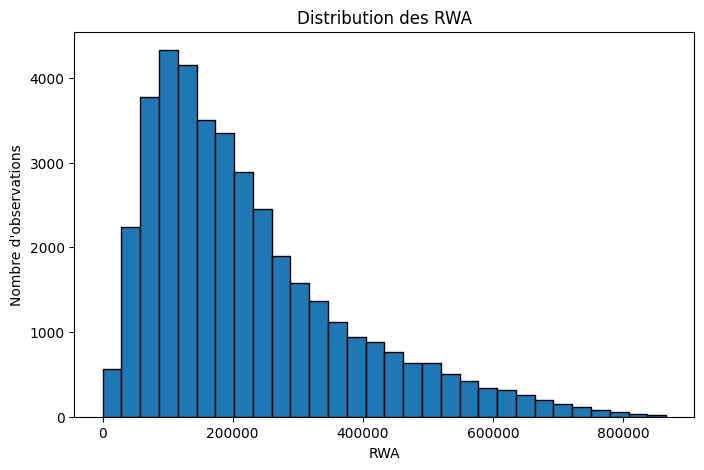

In [110]:
plt.figure(figsize=(8, 5))
plt.hist(df_model_final1["RWA"], bins=30, edgecolor="black")
plt.xlabel("RWA")
plt.ylabel("Nombre d'observations")
plt.title("Distribution des RWA")
plt.show()


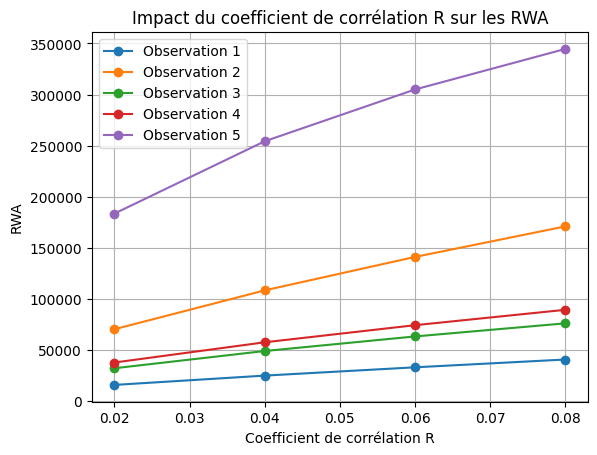

In [111]:
R_values = [0.02, 0.04, 0.06, 0.08]
for idx in range(5):  # Afficher pour les 5 premières observations
    plt.plot(R_values, df_model_final1.iloc[idx][[f'RWA_R={R}' for R in R_values]], marker='o', label=f'Observation {idx+1}')

plt.xlabel("Coefficient de corrélation R")
plt.ylabel("RWA")
plt.title("Impact du coefficient de corrélation R sur les RWA")
plt.legend()
plt.grid()
plt.show()
